# ⭐AIFFEL 대전 1기 Exploration 20.cGAN⭐
>  프로젝트 소개: cGAN을 이용해 새로운 이미지를 생성하자

***

# ✅프로젝트 순서
## 0. 개념 정리
## 10. 회고
- 10-1. 루브릭 평가
- 10-2. 회고

***

# 0. 내용 정리
## 20-2. 조건 없는 생성모델(Unconditional Generative Model), GAN
GAN을 이용해 MNIST, CIFAR-10 등의 데이터셋을 학습하고 생성해 보신 적 있으신가요?  
성공적으로 학습되었다면, 아래와 같이 학습에 사용한 실제 손글씨 이미지와 매우 유사한 손글씨 이미지를 생성했을 것입니다.  

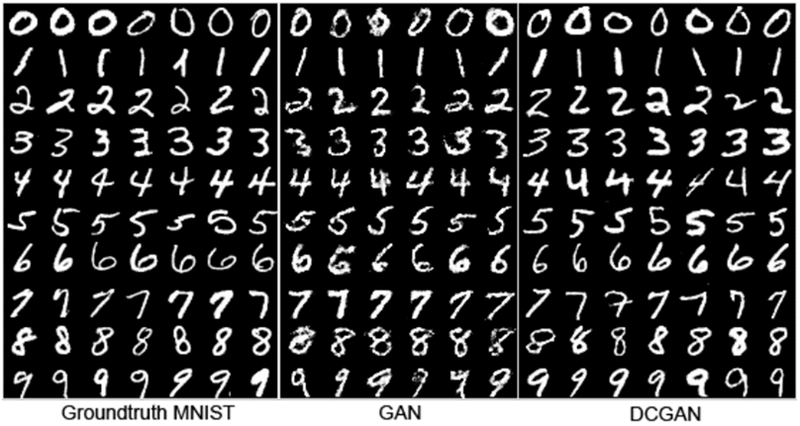  
> https://arxiv.org/pdf/1511.06434.pdf  

여기서 한 가지 생각해봅시다!  

예를 들어, 여러분이 "7"이라는 이미지를 만들고자 MNIST 데이터셋을 이용해 GAN을 열심히 학습시켰습니다.  
학습이 완료된 모델을 이용해 "7"이라 쓰여있는 이미지를 얻기 위해 어떤 방법을 이용해야 할까요?🤔  
여기서 할 수 있는 방법으로는 그저 다양한 노이즈를 계속 입력으로 넣어보고 "7"이라는 숫자 이미지가 생성되길 기다리는 것이죠.  
운이 좋다면 한 방(?)에 만들 수 있겠지만 운이 없다면 100개가 넘는 이미지를 생성해도 7이 나오지 않을 수 있습니다. (생각보다 가능성이 적지 않습니다😩)  
또한 혹시라도 "7" 이미지를 수만 개 만들어야 한다면, 새로운 노이즈 입력을 몇 번이나 넣어야 할지 상상만 해도 끔찍하네요…🤮  

이렇듯 잘 학습된 GAN을 이용해 실제 이미지를 생성할 때 조금 답답한 점이 하나 있다면, 바로 내가 원하는 종류의 이미지를 바로 생성해 내지 못한다는 것입니다.  
다시 말해서 일반적인 GAN과 같은 unconditioned generative model은 내가 생성하고자 하는 데이터에 대해 제어하기 힘들었습니다.  

우리가 원하는 이미지를 바로바로 생성해 내기 위해서는 어떤 방법을 이용해야 할까요? GAN이라는 생성모델에 내가 원하는 이미지를 만들기 위한 특정 조건을 줄 수는 없을까요?  
기약 없이 "7"이라 쓰인 이미지가 생성되길 기다릴 순 없으니까요.

## 20-3. 조건 있는 생성모델(Conditional Generative Model), cGAN
- Conditional Generative Adversarial Nets (cGAN)은 내가 원하는 종류의 이미지를 생성하고자 할 때 GAN이 가진 생성 과정의 불편함을 해소하여, 내가 원하는 종류의 이미지를 생성할 수 있도록 고안된 방법  
1) GAN의 목적 함수  
먼저 GAN에 대해 간단히 복습해봅시다. GAN 구조는 Generator 및 Discriminator라 불리는 두 신경망이 minimax game을 통해 서로 경쟁하며 발전합니다. 이를 아래와 같은 식으로 나타낼 수 있으며 Generator는 이 식을 최소화하려, Discriminator는 이 식을 최대화하려 학습합니다.   
$$\min_G \max_D V(D,G) = \mathbb{E}_{x\sim p_{data}~(x)}[log D(x)] + \mathbb{E}_{z\sim p_x(z)}[log(1-D(G(z)))]$$  

위 식에서 $z$는 임의 노이즈를, $D$와 $G$는 각각 Discriminator 및 Generator를 의미합니다.  

먼저 $D$의 입장에서 식을 바라봅시다.  
실제 이미지를 1, 가짜 이미지를 0으로 두었을 때, $D$는 이 식을 최대화해야 하며, 우변의 + 를 기준으로 양쪽의 항 $(logD(x))$및 $log(1-D(G(z)))$이 모두 최대가 되게 해야 합니다.  
이를 위해서 두 개의 log가 1이 되게 해야 합니다.  
$D(x)$는 1이 되도록, $D(G(z))$는 0이 되도록 해야 합니다.  
다시 말하면, 진짜 데이터($x$)를 진짜로, 가짜 데이터($G(z)$)를 가짜로 정확히 예측하도록 학습한다는 뜻입니다.  

이번엔 $G$의 입장에서 식을 바라봅시다. $D$와 반대로 $G$는 위 식을 최소화해야 하고 위 수식에서는 마지막 항 $log(1−D(G(z))$만을 최소화하면 됩니다 (우변의 첫 번째 항은 $G$와 관련이 없습니다).  
이를 최소화한다는 것은 log 내부가 0이 되도록 해야함을 뜻하며, $D(G(z))$가 1이 되도록 한다는 말과 같습니다.  
즉, G는 를 입력받아 생성한 데이터 $G(z)$를 D가 진짜 데이터라고 예측할 만큼 진짜 같은 가짜 데이터를 만들도록 학습한다는 뜻입니다.  

2) cGAN의 목적 함수  

GAN과 비교하며 알아볼 cGAN의 목적함수는 아래와 같습니다.
$$\min_G \max_D V(D,G) = \mathbb{E}_{x\sim p_{data}~(x)}[log D(x\lvert{y})] + \mathbb{E}_{z\sim p_x(z)}[log(1-D(G(z\lvert{y})))]$$  

위에서 GAN의 목적함수를 이해했고, GAN의 목적함수와 비교해 위 식에서 달라진 부분을 잘 찾아내셨다면 크게 어렵지 않습니다.  
위 식에서 바뀐 부분은 우변의 + 를 기준으로 양쪽 항에 $y$가 추가되었다는 것뿐입니다.  
$G$와 $D$의 입력에 특정 조건을 나타내는 정보인 $y$를 같이 입력한다는 것이죠.  
이외에는 GAN의 목적함수와 동일하므로 각각 $y$를 추가로 입력받아 $G$의 입장에서 식을 최소화하고, $D$의 입장에서 식을 최대화하도록 학습합니다.  

여기서 함께 입력하는 $y$는 어떠한 정보여도 상관없으며, MNIST 데이터셋을 학습시키는 경우 $y$는 0~9 까지의 label 정보가 됩니다.  
Generator가 어떠한 노이즈 $z$를 입력받았을 때, 특정 조건 $y$가 함께 입력되기 때문에, $y$를 통해 $z$를 어떠한 이미지로 만들어야 할지에 대한 방향을 제어할 수 있게 됩니다.  
조금 다르게 표현하면 $y$가 임의 노이즈 입력인 $z$의 가이드라고 할 수 있겠죠.  

3) 그림으로 이해하기  
이번에는 GAN과 cGAN의 Feed forward 과정을 그림으로 비교해서 봅시다.  
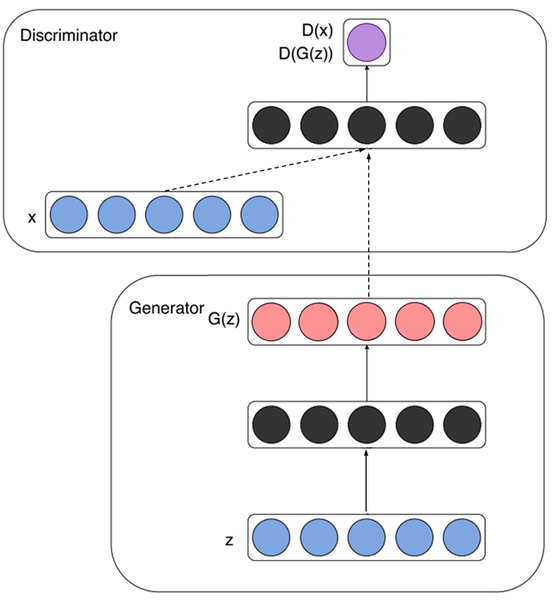  

GAN의 학습 과정은 위 그림과 같습니다.

- Generator  
노이즈 $z$(파란색)가 입력되고 특정 representation(검정색)으로 변환된 후 가짜 데이터 $G(z)$(빨간색)를 생성해 냅니다.  
- Discriminator  
실제 데이터 $x$와 Generator가 생성한 가짜 데이터 $G(z)$를 각각 입력받아 $D(x)$및 $D(G(z))$(보라색)를 계산하여 진짜와 가짜를 식별해 냅니다.  
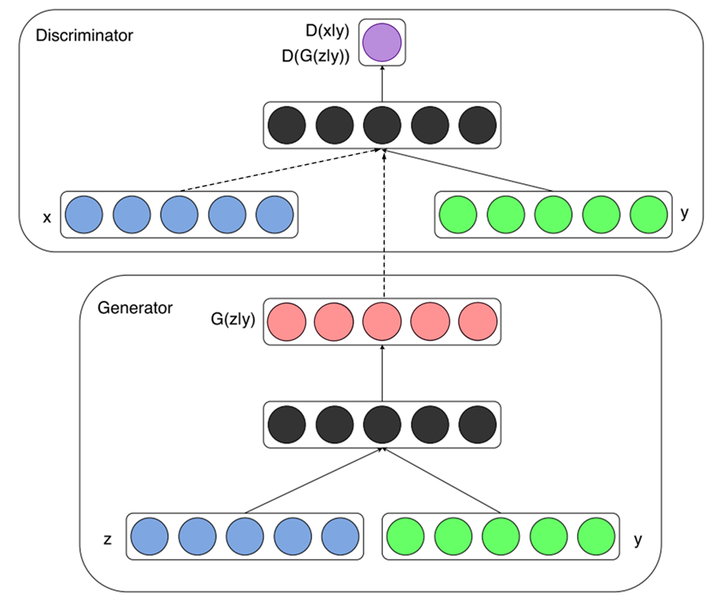  

이전 목적함수에서 확인했듯이, cGAN에서 바뀐 부분은 $y$라는 정보가 함께 입력된다는 것입니다.  

- **Generator** 노이즈 $z$(파란색)와 추가 정보 $y$(녹색)을 함께 입력받아 Generator 내부에서 결합되어 representation(검정색)으로 변환되며 가짜 데이터 $G(z∣y)$를 생성합니다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우$y$는 레이블 정보이며, 일반적으로 one-hot 벡터를 입력으로 넣습니다.  

- **Discriminator** 실제 데이터 $x$와 Generator가 생성한 가짜 데이터 $G(z∣y)$를 각각 입력받으며, 마찬가지로 $y$정보가 각각 함께 입력되어 진짜와 가짜를 식별합니다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우 실제 데이터 $x$와 $y$는 알맞은 한 쌍("7"이라 쓰인 이미지의 경우 레이블도 7)을 이뤄야 하며, 마찬가지로 Generator에 입력된 $y$와 Discriminator에 입력되는 $y$는 동일한 레이블을 나타내야 합니다.  

***

## 20-4. 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기
이제부터는 앞에서 계속 비교해온 GAN과 cGAN을 각각 간단하게 구현하고 실험해보겠습니다.  
간단한 실험을 위해 MNIST 데이터셋을 이용합니다. 실습 코드는 아래를 참고하여 작성했습니다.  
- 참고: [TF2-GAN](https://github.com/thisisiron/TF2-GAN)  

In [ ]:
import tensorflow_datasets as tfds

mnist, info =  tfds.load(
    "mnist", split="train", with_info=True
)

fig = tfds.show_examples(mnist, info)

여러 개의 숫자 이미지와 그에 알맞은 레이블이 출력되었을 것입니다. 이어서 아래 코드를 실행해 학습 전에 필요한 몇 가지 처리를 수행하는 함수를 정의합니다. 이미지 픽셀값을 -1~1 사이의 범위로 변경했고, 레이블 정보를 원-핫 인코딩(one-hot encoding)했습니다.  
GAN과 cGAN 각각을 실험해 보기 위해 label 정보 사용 유무에 따라 `gan_preprocessing()`과 `cgan_preprocessing()` 두 가지 함수를 구성해 놓았습니다.  

In [ ]:
import tensorflow as tf

BATCH_SIZE = 128

def gan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

def cgan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    
    label = tf.one_hot(data["label"], 10)
    return image, label

gan_datasets = mnist.map(gan_preprocessing).shuffle(1000).batch(BATCH_SIZE)
cgan_datasets = mnist.map(cgan_preprocessing).shuffle(100).batch(BATCH_SIZE)
print("✅")

원하는 대로 정확히 처리되었는지 한 개 데이터셋만 선택해 확인해봅시다. 이미지에 쓰인 숫자와 레이블이 일치해야 하고, 이미지 값의 범위가 -1~1 사이에 있어야 합니다.

In [ ]:
import matplotlib.pyplot as plt

for i,j in cgan_datasets : break

# 이미지 i와 라벨 j가 일치하는지 확인해 봅니다.     
print("Label :", j[0])
print("Image Min/Max :", i.numpy().min(), i.numpy().max())
plt.imshow(i.numpy()[0,...,0], plt.cm.gray)

원-핫 인코딩으로 표현된 Label과 출력된 이미지가 일치하는지 확인하고싶지만, 보는 법을 모르시겠다구요? 0과 1로 이루어진 원-핫 벡터에는 각자 고유의 인덱스가 있습니다. MNIST의 경우, 숫자 0은 `[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]`, 숫자 6은 `[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]`의 값을 가집니다. 이제 위 코드의 output을 확인해 이미지 i와 라벨 j가 일치하는지 확인해 봅니다

## GAN Generator 구성하기

이번 구현은 Tensorflow2의 Subclassing 방법을 이용하겠습니다. Subclassing 방법은 tensorflow.keras.Model 을 상속받아 클래스를 만들며, 일반적으로 `__init__()` 메서드 안에서 레이어 구성을 정의하고, 구성된 레이어를 `call()` 메서드에서 사용해 forward propagation을 진행합니다. 이러한 Subclassing 방법은 Pytorch의 모델 구성 방법과도 매우 유사하므로 이에 익숙해진다면 Pytorch의 모델 구성 방법도 빠르게 습득할 수 있습니다.  
먼저 GAN의 Generator를 아래와 같이 구현합니다.

In [ ]:
from tensorflow.keras import layers, Input, Model

class GeneratorGAN(Model):
    def __init__(self):
        super(GeneratorGAN, self).__init__()

        self.dense_1 = layers.Dense(128, activation='relu')
        self.dense_2 = layers.Dense(256, activation='relu')
        self.dense_3 = layers.Dense(512, activation='relu')
        self.dense_4 = layers.Dense(28*28*1, activation='tanh')

        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise):
        out = self.dense_1(noise)
        out = self.dense_2(out)
        out = self.dense_3(out)
        out = self.dense_4(out)
        return self.reshape(out)

print("✅")

`__init__()` 메서드 안에서 사용할 모든 레이어를 정의했습니다. 4개의 fully-connected 레이어 중 한 개를 제외하고 모두 ReLU 활성화를 사용하는 것으로 확인됩니다.
`call()` 메서드에서는 노이즈를 입력받아 `__init__()`에서 정의된 레이어들을 순서대로 통과합니다.
Generator는 숫자가 쓰인 이미지를 출력해야 하므로 마지막 출력은 layers.Reshape()을 이용해 (28,28,1) 크기로 변환됩니다. 

## cGAN Generator 구성하기

이번에는 cGAN의 Generator를 살펴봅시다.


In [ ]:
class GeneratorCGAN(Model):
    def __init__(self):
        super(GeneratorCGAN, self).__init__()
        
        self.dense_z = layers.Dense(256, activation='relu')
        self.dense_y = layers.Dense(256, activation='relu')
        self.combined_dense = layers.Dense(512, activation='relu')
        self.final_dense = layers.Dense(28 * 28 * 1, activation='tanh')
        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise, label):
        noise = self.dense_z(noise)
        label = self.dense_y(label)
        out = self.combined_dense(tf.concat([noise, label], axis=-1))
        out = self.final_dense(out)
        return self.reshape(out)
    
print("✅")

GAN의 Generator보다 구현이 복잡한듯 하지만 ,이전에 cGAN을 이해한 대로 두 구조의 차이점은 레이블 정보가 추가된다는 것 뿐입니다. 이번에는 여러분이 위 코드를 자세히 보고, 어떠한 연산이 이루어지는지 생각해봅시다.  
cGAN의 입력은 2개(노이즈 및 레이블 정보)라는 점을 기억해주세요. (이전 GAN코드와 비교하여 잘 생각해 봅시다)

## 20-5. 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기
### GAN Discriminator 구성하기

이전에 임의 노이즈 및 레이블 정보로부터 숫자 이미지를 생성하는 Generator를 구현했습니다. 이번에는 실제 이미지와 Generator가 생성한 이미지에 대해 진짜와 가짜를 식별하는 Discriminator를 구현해 보겠습니다.  

먼저 GAN의 Discriminator를 아래와 같이 구현합니다.

In [ ]:
class DiscriminatorGAN(Model):
    def __init__(self):
        super(DiscriminatorGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.blocks = []
        for f in [512, 256, 128, 1]:
            self.blocks.append(
                layers.Dense(f, activation=None if f==1 else "relu")
            )
        
    def call(self, x):
        x = self.flatten(x)
        for block in self.blocks:
            x = block(x)
        return x
    
print("✅")

여기에서는 `__init__()`에 `blocks`라는 리스트를 하나 만들어 놓고, for loop를 이용하여 필요한 레이어들을 차곡차곡 쌓아놓았습니다. 이러한 방식을 이용하면 각각의 fully-connected 레이어를 매번 정의하지 않아도 되므로 많은 레이어가 필요할 때 편리합니다. Discriminator의 입력은 Generator가 생성한 (28,28,1) 크기의 이미지이며, 이를 fully-connected 레이어로 학습하기 위해 `call()`에서는 가장 먼저 `layers.Flatten()`이 적용됩니다. 이어서 레이어들이 쌓여있는 `blocks`에 대해 for loop를 이용하여 레이어들을 순서대로 하나씩 꺼내 입력 데이터를 통과시킵니다. 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다. 

### cGAN Discriminator 구성하기

다음으로 구현할 cGAN의 Discriminator는 `Maxout`이라는 특별한 레이어가 사용됩니다. `Maxout`은 간단히 설명하면 두 레이어 사이를 연결할 때, 여러 개의 fully-connected 레이어를 통과시켜 그 중 가장 큰 값을 가져오도록 합니다. 만약 2개의 fully-connected 레이어를 사용할 때 `Maxout`을 식으로 표현하면 아래와 같습니다.   
$$max(w_1^Tx+b_1,\ w_2^Tx+b_2)$$  

Maxout에 대한 자세한 정보는 아래 출처에서 확인할 수 있습니다.  
- [[라온피플] Stochastice Pooling & Maxout](https://m.blog.naver.com/PostView.nhn?blogId=laonple&logNo=221259325819&proxyReferer=&proxyReferer=https:%2F%2Fwww.google.com%2F)  
- [[paper] Maxout Networks](https://arxiv.org/pdf/1302.4389.pdf)  

아래 코드와 같이 `Maxout`을 구성할 수 있습니다.
`tensorflow.keras.layers.Layer`를 상속받아 레이어를 정의했습니다.
이전에 모델을 정의한 것과 비슷하게 `__init__()`, `call()` 메서드를 구성합니다.  

In [ ]:
class Maxout(layers.Layer):
    def __init__(self, units, pieces):
        super(Maxout, self).__init__()
        self.dense = layers.Dense(units*pieces, activation="relu")
        self.dropout = layers.Dropout(.5)    
        self.reshape = layers.Reshape((-1, pieces, units))
    
    def call(self, x):
        x = self.dense(x)
        x = self.dropout(x)
        x = self.reshape(x)
        return tf.math.reduce_max(x, axis=1)

print("✅")

`Maxout` 레이어를 구성할 때 `units`과 `pieces`의 설정이 필요하며, `units` 차원 수를 가진 fully-connected 레이어를 `pieces`개 만큼 만들고 그 중 최대 값을 출력합니다. 예를 들어, 사용할 `Maxout` 레이어가 `units=100`, `pieces=10`으로 설정 된다면 입력으로 부터 100차원의 representation을 10개 만들고, 10개 중에서 최대값을 가져와 최종 1개의 100차원 representation이 출력됩니다. 식으로 나타낸다면 아래와 같습니다. (위 예시에서는 각각의 wx+b가 모두 100차원 입니다)  

$$max(w_1^Tx+b_1,\ w_2^Tx+b_2, \ …, \ w_9^Tx+b_9,\ w_{10}^Tx+b_{10})$$  



위에서 정의한 `Maxout` 레이어를 3번만 사용하면 아래와 같이 쉽게 cGAN의 Discriminator를 구성할 수 있습니다.

In [ ]:
class DiscriminatorCGAN(Model):
    def __init__(self):
        super(DiscriminatorCGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.image_block = Maxout(240, 5)
        self.label_block = Maxout(50, 5)
        self.combine_block = Maxout(240, 4)
        
        self.dense = layers.Dense(1, activation=None)
    
    def call(self, image, label):
        image = self.flatten(image)
        image = self.image_block(image)
        label = self.label_block(label)
        x = layers.Concatenate()([image, label])
        x = self.combine_block(x)
        return self.dense(x)
    
print("✅")

GAN의 Discriminator와 마찬가지로 Generator가 생성한 (28,28,1) 크기의 이미지가 입력되므로, `layers.Flatten()`이 적용됩니다. 그리고 이미지 입력 및 레이블 입력 각각은 `Maxout` 레이어를 한번씩 통과한 후 서로 결합되어 `Maxout` 레이어를 한번 더 통과합니다. 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다.

## 20-6. 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기

이전에 정의한 Generator 및 Discriminator를 이용해 MINST를 학습하고 각 모델로 직접 숫자 손글씨를 생성해봅시다.
우선 GAN, cGAN 각각의 모델 학습에 공통적으로 필요한 loss function과 optimizer를 정의합니다.
진짜 및 가짜를 구별하기 위해 `Binary Cross Entropy`를 사용하고, `Adam optimizer`를 이용해 학습하겠습니다.

In [ ]:
from tensorflow.keras import optimizers, losses

bce = losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

gene_opt = optimizers.Adam(1e-4)
disc_opt = optimizers.Adam(1e-4)    

print("✅")

### GAN으로 MNIST 학습하기

이전 단계에서 구성한 GeneratorGAN 및 DiscriminatorGAN 모델 클래스를 이용합니다.
여기서는 입력으로 사용되는 노이즈를 100차원으로 설정했으며, 하나의 배치 크기 데이터로 모델을 업데이트하는 함수를 아래와 같이 작성했습니다.

In [ ]:
gan_generator = GeneratorGAN()
gan_discriminator = DiscriminatorGAN()

@tf.function()
def gan_step(real_images):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        # Generator를 이용해 가짜 이미지 생성
        fake_images = gan_generator(noise)
        # Discriminator를 이용해 진짜 및 가짜이미지를 각각 판별
        real_out = gan_discriminator(real_images)
        fake_out = gan_discriminator(fake_images)
        # 각 손실(loss)을 계산
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    # gradient 계산
    gene_grad = tape.gradient(gene_loss, gan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, gan_discriminator.trainable_variables)
    # 모델 학습
    gene_opt.apply_gradients(zip(gene_grad, gan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, gan_discriminator.trainable_variables))
    return gene_loss, disc_loss

print("✅")

위 함수를 이용해 우선 10 epoch만큼 학습을 진행해 보겠습니다. 100번의 반복마다 각 손실(loss)을 출력하도록 했습니다.

In [ ]:
EPOCHS = 10
for epoch in range(1, EPOCHS+1):
    for i, images in enumerate(gan_datasets):
        gene_loss, disc_loss = gan_step(images)

        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i+1} ITER] G:{gene_loss}, D:{disc_loss}")

짧은 시간 학습된 모델을 테스트해 봅시다. 100차원 노이즈 입력을 10개 사용하여 10개의 숫자 손글씨 데이터를 생성해 시각화합니다.
경고메시지가 출력된다면 그냥 무시하셔도 됩니다.

In [ ]:
import numpy as np

noise = tf.random.normal([10, 100])

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

결과를 보니 아마도 10 epoch의 학습만으로는 좋은 결과를 기대할 수 없나 봅니다.  
위 구현을 그대로 500 epoch 학습한 가중치를 아래에 첨부했으니 한번 사용해 봅시다.  

첨부된 파일(GAN_500.zip)을 다운로드하여 아래와 같이 작업환경을 구성해 주세요.

$ mkdir -p ~/aiffel/conditional_generation/gan  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/GAN_500.zip  

$ mv GAN_500.zip ~/aiffel/conditional_generation/gan  

$ cd ~/aiffel/conditional_generation/gan && unzip GAN_500.zip  

In [ ]:
import os
weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/gan/GAN_500'

noise = tf.random.normal([10, 100]) 

gan_generator = GeneratorGAN()
gan_generator.load_weights(weight_path)

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

위에 보이는 10개의 결과 이미지는 서로 다른 숫자들이 시각화되었을 것입니다 (아닐 수도 있습니다).  
이러한 방법으로는 내가 원하는 특정 숫자 하나를 출력하기 위해 수많은 입력을 넣어야 할 수 있습니다. 내가 원하는 숫자를 바로 얻어내기 위해 아래에서 cGAN을 학습 시켜 봅시다.

### cGAN으로 MNIST 학습하기

이전 단계에서 구성한 GeneratorCGAN 및 DiscriminatorCGAN 모델 클래스를 이용합니다.  
위에서 실행했던 GAN 학습처럼 약간의 학습으로는 제대로 된 생성 결과를 얻을 수 없을 테니 이번에는 연습 삼아 1 epoch만 학습 시켜 보겠습니다.

In [ ]:
cgan_generator = GeneratorCGAN()
cgan_discriminator = DiscriminatorCGAN()

@tf.function()
def cgan_step(real_images, labels):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        fake_images = cgan_generator(noise, labels)
        
        real_out = cgan_discriminator(real_images, labels)
        fake_out = cgan_discriminator(fake_images, labels)
        
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    
    gene_grad = tape.gradient(gene_loss, cgan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, cgan_discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_grad, cgan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, cgan_discriminator.trainable_variables))
    return gene_loss, disc_loss


EPOCHS = 1
for epoch in range(1, EPOCHS+1):
    
    for i, (images, labels) in enumerate(cgan_datasets):
        gene_loss, disc_loss = cgan_step(images, labels)
    
        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i} ITER] G:{gene_loss}, D:{disc_loss}")

학습 과정에서 Generator 및 Discriminator에 레이블 정보만 추가로 입력했다는 점을 제외하면 위에서 학습한 GAN과 큰 차이는 없습니다.  
위 코드로 짧게나마 학습시켜봤는데, 충분한 학습이 되기엔 더 많은 시간을 투자해야 합니다.  
뒤에서 학습해야 할 것들이 많이 남아있으니, 시간을 아끼기 위해 위 코드로 500 epoch 학습한 가중치를 아래에 첨부했습니다.  

첨부된 파일(CGAN_500.zip)을 다운로드하여 아래와 같이 작업환경을 구성해 주세요.

$ mkdir -p ~/aiffel/conditional_generation/cgan  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/CGAN_500.zip  

$ mv CGAN_500.zip ~/aiffel/conditional_generation/cgan  

$ cd ~/aiffel/conditional_generation/cgan && unzip CGAN_500.zip

아래 코드의 가장 윗줄에 있는 `number`라는 변수에 숫자를 할당하지 않았습니다.  
`number`에 0~9 사이의 숫자 중 생성하길 원하는 숫자를 입력해 주시고 아래 코드를 실행시켜봅시다.  
경고메시지가 출력된다면 그냥 무시하셔도 됩니다.

In [ ]:
number = 8  # TODO : 생성할 숫자를 입력해 주세요!!

weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/cgan/CGAN_500'

noise = tf.random.normal([10, 100])

label = tf.one_hot(number, 10)
label = tf.expand_dims(label, axis=0)
label = tf.repeat(label, 10, axis=0)

generator = GeneratorCGAN()
generator.load_weights(weight_path)

output = generator(noise, label)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

출력된 10개 시각화 결과는 어떤가요? 아마도 number에 입력한 숫자에 해당하는 손글씨가 시각화되었을 것입니다.
cGAN을 사용해 조건을 주고 학습하면 이렇게 특정한 숫자를 만들어내기가 훨씬 쉬워졌습니다.😆

## 20-7. GAN의 입력에 이미지를 넣는다면? Pix2Pix

지금까지 cGAN에 대해 알아보고 실험해보면서, 작은 조건만으로 우리가 원하는 클래스의 이미지를 생성할 수 있음을 확인했습니다. 만약 입력자체가 조건이 된다면 어떨까요? cGAN과 같이 클래스 레이블 등의 조건을 함께 입력하는 것이 아니라, 조금 더 자세하게 내가 원하는 이미지를 얻기 위해 이미지를 조건으로 줄 수 없을까요? 이번에 소개드릴 **Pix2Pix**는 기존 노이즈 입력을 이미지로 변환하는 일반적인 GAN이 아니라, **이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델**입니다.  

Pix2Pix를 제안한 논문의 제목은 [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/pdf/1611.07004.pdf) 로 하고자 하는 바가 제목에 그대로 담겨 있습니다.  
Conditional Adversarial Networks로 **Image-to-Image Translation**을 수행한다는 뜻이죠.. Conditional Adversarial Networks는 이전까지 알아봤던 cGAN과 같은 구조를 말하는 것인데, Image-to-Image Translation이란 단어는 무엇을 뜻하는 걸까요? 아래 Pix2Pix 논문에서 수행한 결과를 먼저 살펴봅시다.  

이후 표기되는 이미지에 대한 출처가 명시되지 않은 경우, Pix2Pix 논문에서 가져왔음을 미리 알려드립니다.  

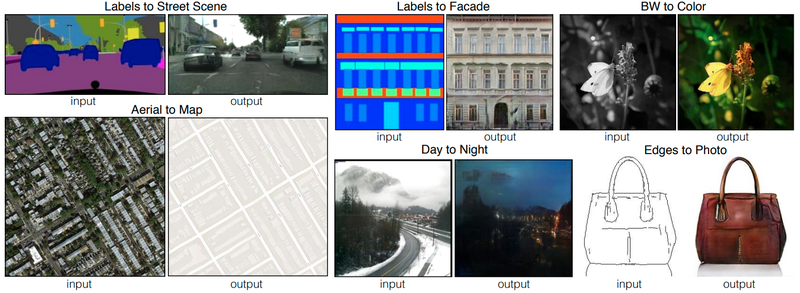

Image-to-Image Translation은 말 그대로 이미지 간 변환을 말합니다.😅  
위 결과의 첫 번째 [Labels to Street Scene] 이미지는 픽셀별로 레이블 정보만 존재하는 segmentation map을 입력으로 실제 거리 사진을 생성해 내었고, 이 외에 흑백 사진을 컬러로 변환하거나, 낮에 찍은 사진을 밤에 찍은 사진으로 변환하거나, 가방 스케치를 이용해 채색된 가방을 만들기도 합니다.  

한 이미지의 픽셀에서 다른 이미지의 픽셀로(pixel to pixel) 변환한다는 뜻에서 Pix2Pix라는 이름으로 불립니다. 이 구조는 최근 활발하게 연구 및 응용되는 GAN 기반의 Image-to-Image Translation 작업에서 가장 기초가 되는 연구입니다.  

노이즈와 레이블 정보를 함께 입력했던 cGAN은 fully-connected 레이어를 연속적으로 쌓아 만들었지만, 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용합니다. GAN 구조를 기반으로 하기 때문에 크게 Generator와 Discriminator 두 가지 구성 요소로 이루어집니다. 아래에서 자세히 알아보겠습니다.

### Pix2Pix (Generator)

Generator는 어떠한 이미지를 입력받아 변환된 이미지를 출력하기 위해 사용됩니다. 여기서 입력 이미지와 변환된 이미지의 크기는 동일해야 하며, 이러한 문제에서 흔히 사용되는 구조는 아래 그림과 같은 Encoder-Decoder 구조입니다.  
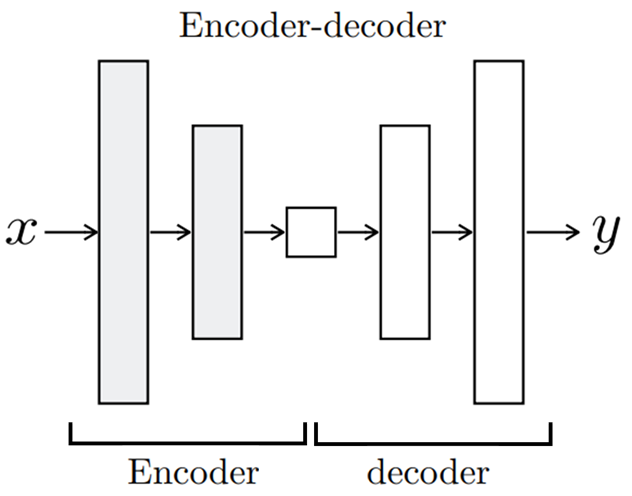  

Encoder에서 입력 이미지($x$)를 받으면 단계적으로 이미지를 down-sampling하면서 입력 이미지의 중요한 representation을 학습합니다. Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지($y$)를 생성해냅니다. 이러한 과정은 모두 convolution 레이어로 진행되며, 레이어 내의 수많은 파라미터를 학습하여 잘 변환된 이미지를 얻도록 합니다. 여기서 한 가지 짚고 넘어갈 부분은, Encoder의 최종 출력은 위 그림 중간에 위치한 가장 작은 사각형이며, `bottleneck` 이라고도 불리는 이 부분은 입력 이미지($x$)의 가장 중요한 특징만을 담고 있습니다.  

과연 이 중요하지만 작은 특징이 변환된 이미지($y$)를 생성하는데 충분한 정보를 제공할까요? 이와 같은 점을 보완하기 위해 논문에서는 Generator 구조를 하나 더 제안합니다.  
아래 그림과 같은 **U-Net **구조입니다.  

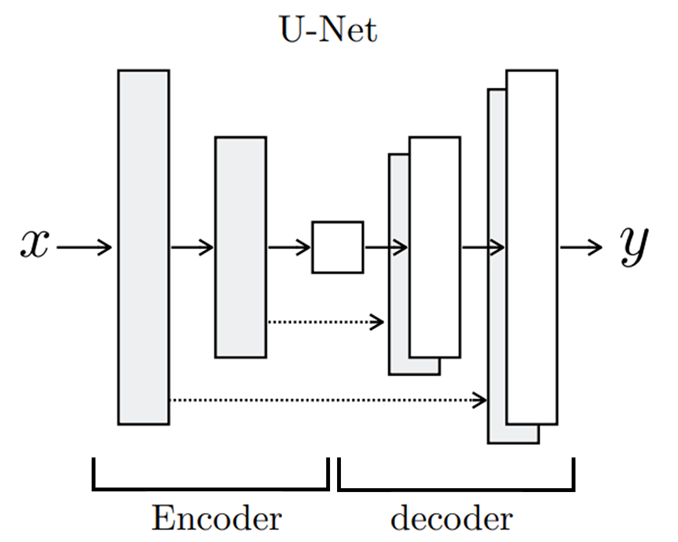  

위에서 살펴본 단순한 Encoder-Decoder로 구성된 Generator와 다른 점은, 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있다는 것입니다. Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로부터 더 많은 추가 정보를 이용하는 방법이며, 이러한 U-Net 구조의 Generator를 사용해 아래와 같이 단순한 Encoder-Decoder 구조의 Generator를 사용한 결과에 비해 비교적 선명한 결과를 얻을 수 있었습니다.  

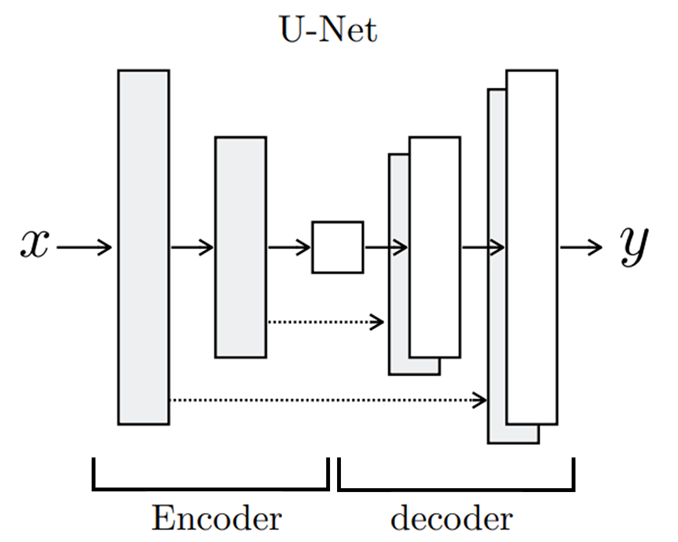  

여기서 U-Net은 이전에 segmentation 작업을 위해 제안된 구조입니다. U-Net에 대한 자세한 사항은 이번 노드의 학습 범위를 벗어나므로 아래에 잘 정리된 자료를 첨부합니다.   

- [U-Net 논문 리뷰](https://medium.com/@msmapark2/u-net-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0-u-net-convolutional-networks-for-biomedical-image-segmentation-456d6901b28a)

### Pix2Pix (Loss Function)

예상컨데 위 Generator 구조를 보면서 한 번쯤 생각해 보셨을 것 같은 사항으로는 "Generator만으로도 이미지 변환이 가능하지 않을까?" 입니다.  

당연하게도 변환하고자 하는 이미지를 Encoder에 입력하여 Decoder의 출력으로 변환된 이미지를 얻을 수 있습니다. 출력된 이미지와 실제 이미지의 차이로 L2(MSE), L1(MAE) 같은 손실을 계산한 후 이를 역전파하여 네트워크를 학습시키면 되겠죠. 이미지 변환이 가능은 하지만 문제는 변환된 이미지의 품질입니다. 아래 사진의 L1이라 써있는 결과가 Generator 만을 사용해 변환된 이미지와 실제 이미지 사이의 L1 손실을 이용해 만들어낸 결과입니다.  

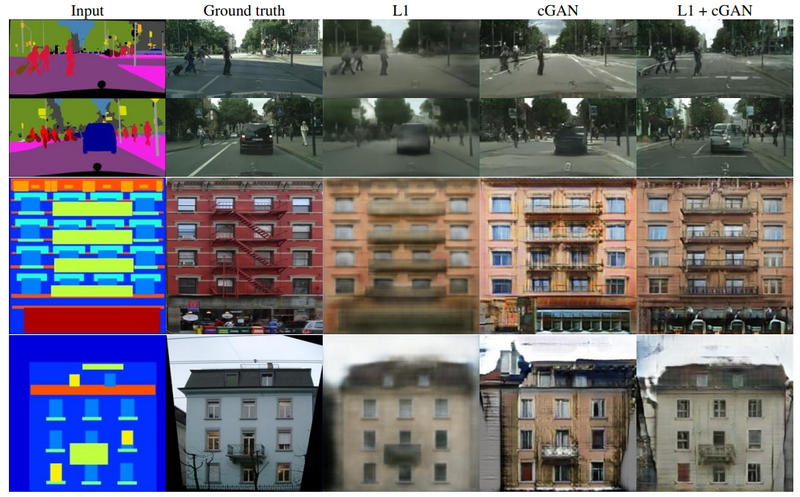  

L1 이라 쓰여있는 Generator만으로 생성된 결과는 매우 흐릿합니다. 이미지를 변환하는데 L1(MAE)이나 L2(MSE) 손실만을 이용해서 학습하는 경우 이렇게 결과가 흐릿해지는 경향이 있습니다. Generator가 단순히 이미지의 평균적인 손실만을 줄이고자 파라미터를 학습하기 때문에 이러한 현상이 불가피합니다.  

반면 위 그림의 cGAN이라 쓰여진 GAN 기반의 학습 방법은 비교적 훨씬 더 세밀한 정보를 잘 표현하고 있습니다. Discriminator를 잘 속이려면 Generator가 (Ground truth라고 쓰여진 이미지같이) 진짜 같은 이미지를 만들어야 하기 때문이죠. 논문에서는 L1손실과 GAN 손실을 같이 사용하면 더욱더 좋은 결과를 얻을 수 있다고 합니다 (위 그림의 L1+cGAN). 

### Pix2Pix (Discriminator)

위 결과에서 보듯 실제 같은 이미지를 얻기 위해서는 GAN의 학습 방법을 이용해야 하며, 위에서 설명한 Generator를 발전시킬 서포터이자 경쟁자, Discriminator가 필요하겠죠. 혹시 이전에 다뤘던 DCGAN의 Discriminator 기억하시나요? 아래 그림은 DCGAN의 Discriminator를 나타냅니다.  

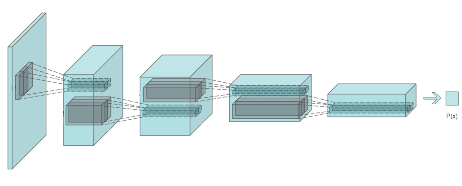  
> [출처 : https://sh-tsang.medium.com/review-dcgan-deep-convolutional-generative-adversarial-network-gan-ec390cded63c]  

DCGAN의 Discriminator는 생성된 가짜이미지 혹은 진짜이미지를 하나씩 입력받아 convolution 레이어를 이용해 점점 크기를 줄여나가면서, 최종적으로 하나의 이미지에 대해 하나의 확률값을 출력했습니다. Pix2Pix는 이 과정에서 의문을 갖습니다.  

> 하나의 전체 이미지에 대해 하나의 확률값만을 도출하는 것이 진짜 혹은 가짜를 판별하는 데 좋은 것일까?  

Pix2Pix는 이러한 의문점을 가지고 아래 그림과 같은 조금 다른 방식의 Discriminator를 사용합니다.  
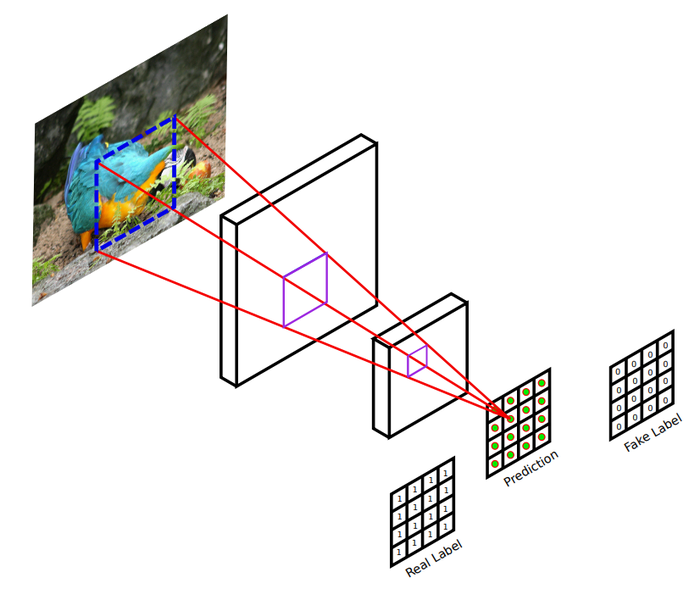  

> [출처 : https://arxiv.org/pdf/1803.07422.pdf]  

위 그림은 Pix2Pix에서 사용되는 Discriminator를 간략하게 나타냅니다. 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률값을 나타내는 최종 결과를 생성하는데, 그 결과는 하나의 값이 아닌 여러 개의 값을 갖습니다 (위 그림의 Prediction은 16개의 값을 가지고 있습니다). 위 그림에서 입력이미지의 파란색 점선은 여러 개의 출력 중 하나의 출력을 계산하기 위한 입력이미지의 receptive field 영역을 나타내고 있으며, 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률값을 도출한다는 것입니다.

이런 방식으로 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률값을 계산할 수 있으며 이 값을 평균하여 최종 Discriminator의 출력을 생성합니다. 이러한 방법은 이미지의 일부 영역(patch)을 이용한다고 하여 **PatchGAN**이라고 불립니다. 일반적으로 이미지에서 **거리가 먼 두 픽셀은 서로 연관성이 거의 없기 때문에** 특정 크기를 가진 **일부 영역에 대해서 세부적으로 진짜/가짜를 판별**하는 것이 Generator로 하여금 더 진짜 같은 이미지를 만들도록 하는 방법입니다.

아래 그림은 (위 그림의 파란색 점선 같은) 판별 영역을 다양한 크기로 실험하여 그 결과를 보여줍니다.  

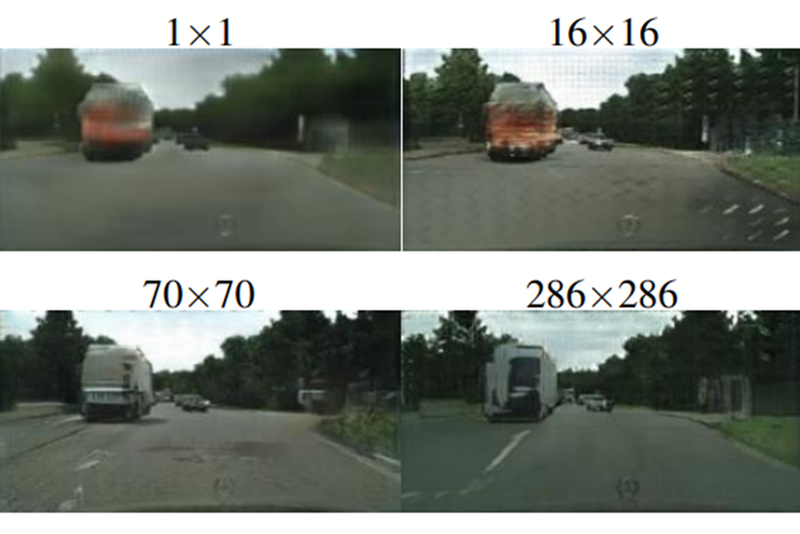  

마지막에 보이는 286x286이라 적힌 이미지는 DCGAN의 Discriminator와 같이 전체 이미지에 대해 하나의 확률값을 출력하여 진짜/가짜를 판별하도록 학습한 결과입니다 (입력 이미지 크기가 286x286 입니다). 70x70 이미지는 Discriminator입력 이미지에서 70x70 크기를 갖는 일부 영역에 대해서 하나의 확률값을 출력한 것이며, 16x16, 1x1로 갈수록 더 작은 영역을 보고 각각의 확률값을 계산하므로 Discriminator의 출력값의 개수가 더 많습니다. 위 4개의 이미지를 살펴보면, 너무 작은 patch를 사용한 결과(1x1, 16x16)는 품질이 좋지 않으며, 70x70 patch를 이용한 결과가 전체 이미지를 사용한 결과(286x286)보다 조금 더 사실적인 이미지를 생성하므로 PatchGAN의 사용이 성공적이라고 볼 수 있을 것 같습니다.  

지금까지 Pix2Pix의 Generator와 Discriminator, Loss function을 구성하는 기본 아이디어들에 대해서 간략하게 알아봤습니다. 다음 단계부터는 Pix2Pix를 구현하면서 더 자세히 이해해봅시다.

## 20-8. 난 스케치를 할 테니 너는 채색을 하거라 (1) 데이터 준비하기

이번에는 앞서 알아본 pix2pix 모델에 대해서 직접 구현하고 실험해봅시다. 사용해볼 데이터셋은 `Sketch2Pokemon`이라는 데이터셋입니다.  

- [Sketch2Pokemon info](https://www.kaggle.com/norod78/sketch2pokemon)  

위 출처에는 학습용 데이터 셋에 830개의 이미지가 있으며, 각 (256x256) 크기의 이미지 쌍이 나란히 붙어 (256x512) 크기의 이미지로 구성되어 있다고 합니다. 아래 링크에서 다운로드해서 직접 확인해봅시다. (위 출처에서 학습용 데이터셋만 따로 가져왔습니다)  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/sketch2pokemon.zip  

$ mv sketch2pokemon.zip ~/aiffel/conditional_generation  

$ cd ~/aiffel/conditional_generation && unzip sketch2pokemon.zip

In [ ]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/pokemon_pix2pix_dataset/train/'
print("number of train examples :", len(os.listdir(data_path)))

출처의 내용과 같이 830개 이미지가 있음을 확인할 수 있습니다.

이번에는 아래 코드를 이용해 각각의 이미지들이 어떻게 생겼는지 확인해 봅시다. 학습용 데이터셋에서 임의로 6장을 선택하여 시각화합니다.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

하나의 이미지에 포켓몬 스케치와 실제 포켓몬 이미지가 함께 포함되어 있음을 확인할 수 있습니다. 위 코드를 여러 번 반복 실행해 보면 일부는 제대로 스케치 되지 않은 이미지도 확인할 수 있습니다. 출처를 확인해보니 직접 그려서 만든 데이터셋이 아닌 스케치 생성 모델을 이용해서 만들었다고 하네요 😅

이미지를 하나 열어 아래와 같이 크기를 확인해 보겠습니다.

In [ ]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)으로 확인되었습니다. 모델 학습에 사용할 데이터를 (256, 256, 3) 크기의 2개 이미지로 분할하여 사용하면 될 것 같네요.

아래 코드로 이미지를 나누어 봅시다.

In [ ]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

위와 같이 두 개 이미지로 나누었습니다. 첫 번째 스케치를 다음 단계에서 구성할 Pix2Pix 모델에 입력하여 두 번째 그림과 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표입니다.  

앞서 살펴봤듯이 학습에 사용할 수 있는 데이터의 수는 약 800개뿐입니다. 학습에 사용하는 데이터의 다양성을 높이기 위해 아래 코드와 같이 여러 augmentation 방법을 적용해 보겠습니다.

In [ ]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

`apply_augmentation` 함수는 스케치 및 채색된 2개 이미지를 입력으로 받아 여러 가지 연산을 두 이미지에 동일하게 적용합니다.  
입력된 이미지에 어떠한 과정이 적용되는지 위 코드를 보면서 아래 퀴즈를 풀어봅시다.  

위와 같이 구성한 함수를 데이터에 적용해 시각화 해봅시다.

In [ ]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

매우 다양한 이미지가 생성됩니다. 여기서 사용한 augmentation 방법 외에 더 많은 방법을 활용한다면 더욱더 다양한 데이터셋을 만들어 좋은 일반화 결과를 기대해 볼 수 있습니다.😆  

마지막으로 위 과정들을 학습 데이터에 적용하며, 잘 적용되었는지 하나의 이미지만 시각화하여 확인해 보겠습니다.

In [ ]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## 20-9. 난 스케치를 할 테니 너는 채색을 하거라 (2) Generator 구성하기

이제부터 본격적으로 Pix2Pix 구조를 구현합니다. 앞서 cGAN 구현과 같이 Tensorflow의 Subclassing 방법을 이용해 모델을 만들겠습니다.  

### Generator의 구성요소 알아보기
먼저, pix2pix 논문에서 Generator를 구성하는데 필요한 정보를 아래에 가져왔습니다. 한번 읽어보시고 아래 질문에 답해봅시다.  

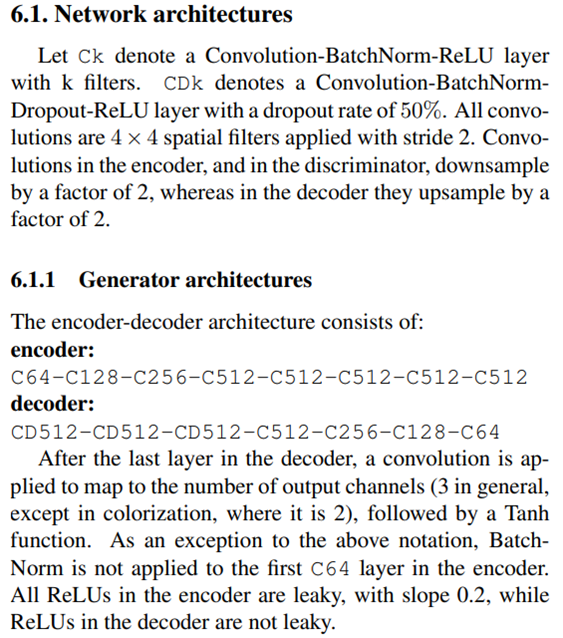  

Q6. 논문에서 표기한 encoder의 "C64"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?  
- 64개의 4x4 필터에 stride 2를 적용한 Convolution → 0.2 slope의 LeakyReLU  
(위 논문의 아래 단락에 BatchNorm을 사용하지 않는다고 쓰여 있습니다)  

Q7. 논문에서 표기한 decoder의 "CD512"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?  
- 512개의 4x4 필터에 stride 2를 적용한 (Transposed) Convolution → BatchNorm → 50% Dropout → ReLU  

아마도 위 두 개의 질문에 잘 답하셨다면, Generator를 구성하는데 필요한 레이어들은 대략적으로 숙지하셨으리라 생각됩니다.  
이번에는 아래와 같이 보기 쉽게 표현한 그림을 통해 Generator의 전체 구조를 머리속에 조금 더 자세히 그려봅시다.  

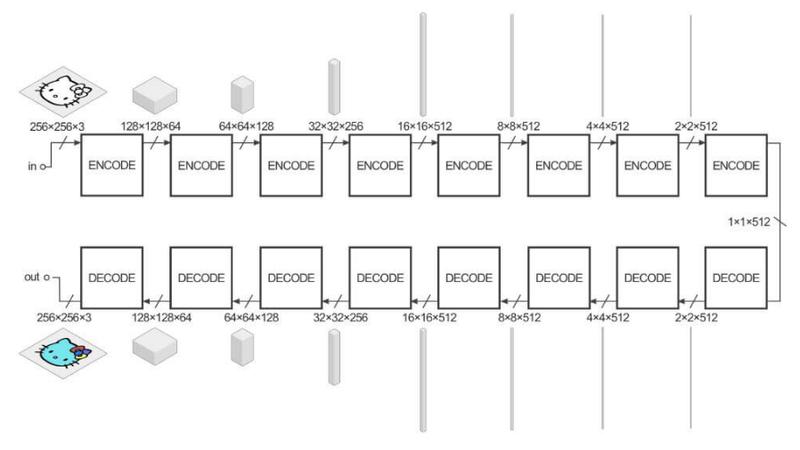  

위 그림에서 `ENCODE` 또는 `DECODE`라고 쓰인 각각의 블록을 기준으로 양쪽에 쓰인 입출력 크기에 집중해주세요.  
"in"이라고 쓰여진 입력 부분부터 윗줄의 화살표를 쭉 따라가면 계산된 결과의 (width, height) 크기가 점점 절반씩 줄어들며 최종적으로 (1,1)이 되고, 채널의 수는 512까지 늘어나는 것을 확인할 수 있습니다.  
처음 입력부터 시작해서 (1,1,512) 크기를 출력하는 곳까지가 Encoder 부분입니다.  

이어서 아랫줄 화살표를 따라가면 (width, height) 크기가 점점 두 배로 늘어나 다시 (256, 256) 크기가 되고, 채널의 수는 점점 줄어들어 처음 입력과 같이 3채널이 됩니다. (1,1,512)를 입력으로 최종 출력까지의 연산들이 Decoder 부분입니다.  



### Generator 구현하기

위 정보들을 토대로 여러분의 머릿속에 희미하게 그려진 Generator의 Encoder 부분을 구현하겠습니다.  
먼저 위 논문에서 "C64", "C128" 등으로 쓰여진 것과 같이 "Convolution → BatchNorm → LeakyReLU"의 3개 레이어로 구성된 기본적인 블록을 아래와 같이 하나의 레이어로 만들었습니다.

In [ ]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

`__init__()` 메서드에서 `n_filters`, `use_bn`를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정 할 수 있습니다.  
이외 Convolution 레이어에서 필터의 크기(=4) 및 stride(=2)와 LeakyReLU 활성화의 slope coefficient(=0.2)는 모든 곳에서 고정되어 사용하므로 각각의 값을 지정했습니다.  
Encoder에 사용할 기본 블록을 구성했으니 이 블록을 여러 번 가져다 사용하면 아래와 같이 쉽게 Encoder를 구성할 수 있습니다.  

In [ ]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

각 블록을 거치면서 사용할 필터의 개수를 `filters`라는 리스트에 지정해 두었으며, `blocks`이라는 리스트에는 사용할 블록들을 정의해 넣어두고, `call()` 메서드에서 차례대로 블록들을 통과합니다. 앞서 퀴즈로 알아본 것처럼 Encoder 첫 번째 블록에서는 BatchNorm을 사용하지 않습니다.  
`get_summary`는 레이어가 제대로 구성되었는지 확인하기 위한 용도로 따로 만들어 놓았습니다. 위에서 구성한 Encoder에 (256,256,3) 크기의 데이터를 입력했을 때, 어떤 크기의 데이터가 출력되는지 살펴봅시다. 만들어 놓은 `get_summary` 메서드를 바로 불러오시면 됩니다.  

In [ ]:
Encoder().get_summary()

블록을 통과할수록 (width, height) 크기는 반씩 줄어들고, 사용된 필터의 수는 최대 512개로 늘어나 최종 (1,1,512)로 알맞은 크기가 출력됨을 확인 할 수 있습니다.  

이번엔 Decoder를 구현합니다. Encoder와 마찬가지로 사용할 기본 블록을 정의하고, 이 블록을 여러 번 반복하여 아래와 같이 Decoder를 만들겠습니다.

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,256)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

처음 세 개의 블록에서만 `Dropout`을 사용했으며, 마지막 convolution에는 3개의 필터를 사용해 출력하는 것을 확인할 수 있습니다.  
마찬가지로 (1,1,512) 크기의 데이터가 입력되었을 때, 어떤 크기가 출력되는지 확인해봅시다.

In [ ]:
Decoder().get_summary()

(width, height) 크기가 점점 늘어나고 사용 필터의 수는 점점 줄어들어 최종 (256,256,3) 크기로 알맞게 출력되었습니다.  

위에서 구성한 Encoder와 Decoder를 연결시키면 Encoder에서 (256,256,3) 입력이 (1,1,512)로 변환되고, Decoder를 통과해 다시 원래 입력 크기와 같은 (256,256,3)의 결과를 얻을 수 있겠군요. 스케치를 입력으로 이런 연산 과정을 통해 채색된 이미지 출력을 얻을 수 있습니다.
아래 코드와 같이 `tf.keras.Model`을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성해봅시다.  

In [ ]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary()

Generator를 잘 작동시키기 위해서는 약 4000만 개의 파라미터를 잘 학습시켜야 하네요😅

## 20-10. 난 스케치를 할 테니 너는 채색을 하거라 (3) Generator 재구성하기
지금까지 Encoder와 Decoder를 연결시켜 Generator를 만들어 봤습니다.  
하지만 앞서 설명드린 것처럼 Pix2Pix의 Generator 구조는 아래 그림처럼 두 가지를 제안했습니다.  
아래 그림으로 다시 한번 봅시다.  

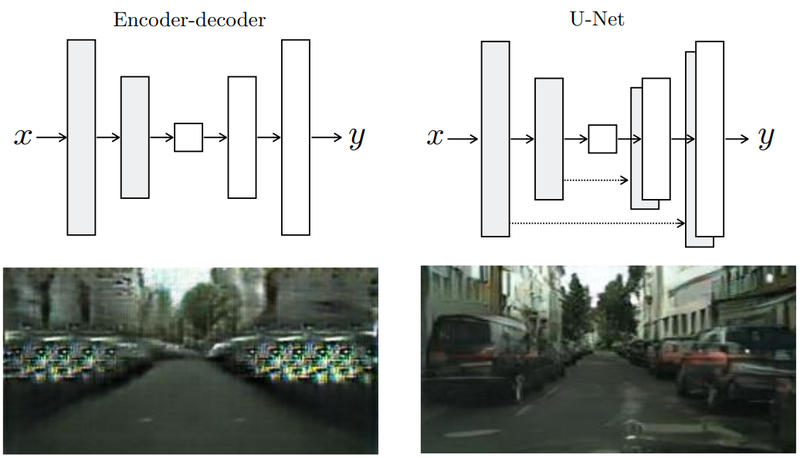  

위 그림에서 각 구조 아래에 표시된 이미지는 해당 구조를 Generator로 사용했을 때의 결과입니다.  

단순한 Encoder-Decoder 구조에 비해 Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가 훨씬 더 실제 이미지에 가까운 품질을 보입니다.  

이전 단계에서 구현했던 Generator는 위 그림의 Encoder-decoder 구조입니다.  
Encoder에서 출력된 결과를 Decoder의 입력으로 연결했고, 이 외에 추가적으로 Encoder와 Decoder를 연결시키는 부분은 없었습니다. 더 좋은 결과를 기대하기 위해 이전에 구현했던 것들을 조금 수정하여 위 그림의 U-Net 구조를 만들고 실험해봅시다.  
(아래 단락부터는 두 가지 구조를 각각 "Encoder-Decoder Generator" 및 "U-Net Generator"라는 용어로 구분하여 사용하겠습니다)  

먼저 Encoder 및 Decoder에 사용되는 기본적인 블록은 이전에 아래 코드와 같이 구현했었습니다.  

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

여기서 특별히 수정해야 할 부분은 없습니다. 그대로 가져다가 사용하겠습니다.  

정의된 블록들을 이용해 한 번에 **U-Net Generator**를 정의해 보겠습니다. 아래 모델의 `__init__()` 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록들을 정의해 놓고, `call()`에서 forward propagation 하도록 합니다. 이전 구현에는 없었던 skip connection이 `call()` 내부에서 어떻게 구현되었는지 잘 확인해봅시다.

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

먼저, `__init__()` 에서 정의된 `encode_blocks` 및 `decode_blocks`가 `call()` 내부에서 차례대로 사용되어 Encoder 및 Decoder 내부 연산을 수행합니다.  
이때, Encoder와 Decoder 사이의 skip connection을 위해 `features` 라는 리스트를 만들고 Encoder 내에서 사용된 각 블록들의 출력을 차례대로 담았습니다.  
이후 Encoder의 최종 출력이 Decoder의 입력으로 들어가면서 다시 한번 각각의 Decoder 블록들을 통과하는데, `features` 리스트에 있는 각각의 출력들이 Decoder 블록 연산 후 함께 연결되어 다음 블록의 입력으로 사용됩니다.  

아래 질문에 답하면서 조금 더 자세히 이해해봅시다.  

Q8. 위 코드의 call() 내에서 ' features = features[:-1]' 는 왜 필요할까요?  
- Skip connection을 위해 만들어진 features 리스트에는 Encoder 내 각 블록의 출력이 들어있는데, Encoder의 마지막 출력(feature리스트 의 마지막 항목)은 Decoder로 직접 입력되므로 skip connection의 대상이 아닙니다.  

Q9. 위 코드의 call() 내의 Decoder 연산 부분에서 features[::-1] 는 왜 필요할까요?  
- Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고, Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등 대칭을 이룹니다(맨 위 U-Net 구조 사진 참고). features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결합니다.  

Q10. 아래와 같은 데이터 A, B가 있을 때,  
데이터 A 크기 : (32,128,128,200) #(batch, width, height, channel)  
데이터 B 크기 : (32,128,128,400) #(batch, width, height, channel)  
여기서 사용되는 skip connection은 layers.Concatenate() 결과의 크기는 무엇일까요?  

- (128,128,600)  
layers.Concatenate() 내에 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결됩니다.  

이제야 Generator 구현이 끝났습니다.  

마지막으로 완성된 U-Net 구조 Generator 내부의 각 출력이 적절한지 아래 코드로 확인해봅시다.

In [ ]:
UNetGenerator().get_summary()

이전 Encoder-Decoder Generator 구조에서 학습해야 할 파라미터는 약 4000만 개 였는데, Skip connection을 추가한 U-Net Generator의 파라미터는 약 5500만 개로 꽤나 많이 늘어났습니다.

Q11. U-Net Generator의 파라미터가 늘어난 곳은 Encoder와 Decoder 중 어디일까요?  
또한, 두 종류의 Generator 구조에서 동일한 수의 convolution 레이어를 사용했는데, 구체적으로 어느 부분에서 파라미터가 늘어났을까요?  
- 정리하면, U-Net Generator에서 사용한 skip-connection으로 인해 Decoder의 각 블록에서 입력받는 채널 수가 늘어났고, 이에 따라 블록 내 convolution 레이어에서 사용하는 필터 크기가 커지면서 학습해야 할 파라미터가 늘어났습니다.

## 20-11. 난 스케치를 할 테니 너는 채색을 하거라 (4) Discriminator 구성하기
Generator만으로 좋은 결과를 도출하기에는 부족합니다. 조금 더 사실적인 이미지를 생성하기 위한 Pix2Pix를 완성시키기 위해서는 Discriminator가 필요합니다.  
이번 단계에서 Discriminator를 만들어 Pix2Pix 구조를 완성시켜 봅시다. 

### Discriminator의 구성요소 알아보기  

Generator를 만들기 전에 봤듯이 먼저 Pix2Pix 논문에서 Discriminator를 구성하는데 필요한 정보를 아래에 가져왔습니다.

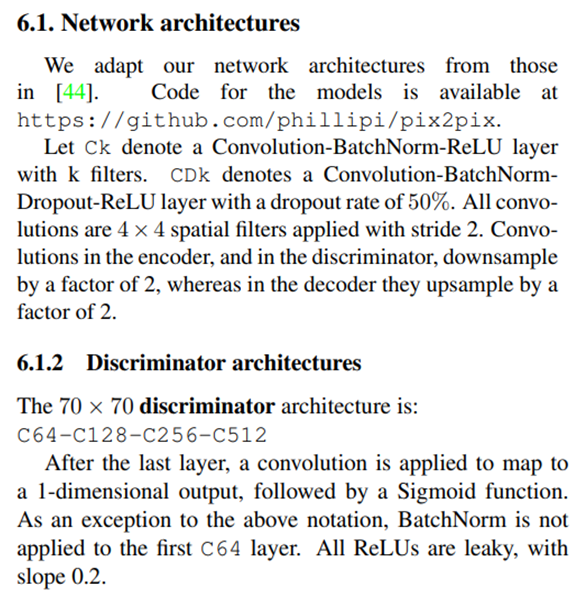

Generator의 구성 요소와 똑같이 "C64" 등으로 표기되어있습니다. 진짜 및 가짜 이미지를 판별하기 위해 최종 출력에 sigmoid를 사용하는 것을 제외하면 특별한 변경 사항은 없는 것 같습니다.  

이어서 아래의 보기 쉽게 표현한 그림을 통해 Discriminator의 구조를 머리속에 조금 더 자세히 그려봅시다.  

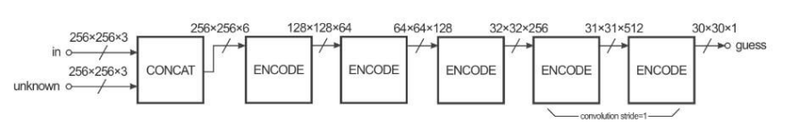  

Discriminator는 2개 입력(위 그림의 "in", "unknown")을 받아 연결(CONCAT)한 후, `ENCODE` 라고 쓰인 5개의 블록을 통과합니다. 이 중 마지막 블록을 제외한 4개 블록은 위 논문에서 표기된 "C64-C128-C256-C512"에 해당하며, 마지막은 1(채널)차원 출력을 위한 블록이 추가되었습니다.  

최종적으로 출력되는 크기는 (30,30,1) 이며, 위 그림의 출력 이전의 2개의 `ENCODE` 블록을 보면 각각의 출력 크기가 32, 31, 30으로 1씩 감소하는 것을 알 수 있습니다. Generator에서도 사용했던 2 stride convolution에 패딩을 이용하면 (width, height) 크기가 절반씩 감소할 것입니다. 1 stride convolution에 패딩을 하지 않는다면 (width, height) 크기는 (필터 크기가 4이므로) 3씩 감소할 텐데, 그림과 같이 1씩 감소하도록 하려면 무언가 다른 방법을 써야 할 것 같네요.🤔 이 부분이 지금 이해되지 않는다면 아래 코드에서 다시 다룰 테니 우선 넘어갑시다.  

추가적으로 위 그림에서 최종 출력 크기가 (30,30)이 되어야 하는 이유는 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용했기 때문입니다. 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정입니다. 이 부분에 대한 설명은 아래 참고 자료로 대신하겠습니다. (아랫글 마지막 부분에 언급합니다)  
- [Understanding PatchGAN](https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207)  

이 부분만 제외하면 전반적으로는 Generator보다 간단한 것 같습니다. 구현해봅시다.  

### Discriminator 구현하기


마찬가지로 Discriminator에 사용할 기본적인 블록부터 만들겠습니다.

In [ ]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

`__init__()` 에서 필요한 만큼 많은 설정을 가능하게끔 했습니다. 필터의 수(`n_filters`), 필터가 순회하는 간격(`stride`), 출력 feature map의 크기를 조절할 수 있도록 하는 패딩 설정(`custom_pad`), BatchNorm의 사용 여부(`use_bn`), 활성화 함수 사용 여부(`act`)가 설정 가능합니다.  

아래 질문에 답하면서 위 코드가 어떻게 동작하는지 생각해봅시다.  

Q12. 위에서 만든 DiscBlock의 설정을 다음과 같이 하여 DiscBlock(n_filters=64, stride=1, custom_pad=True, use_bn=True, act=True) 으로 생성된 블록에 (width, height, channel) = (128, 128, 32) 크기가 입력된다면, 블록 내부에서 순서대로 어떠한 레이어를 통과하는지, 그리고 각 레이어를 통과했을 때 출력 크기는 어떻게 되는지 적어주세요.  

1. (128,128,32) 크기의 입력이 layers.ZeroPadding2D()를 통과하면, width 및 height의 양쪽 면에 각각 1씩 패딩되어 총 2만큼 크기가 늘어납니다. 출력 : (130,130,32)  
2. 패딩하지 않고 필터 크기 4 및 간격(stride) 1의 convolution 레이어를 통과하면 width 및 height 가 3씩 줄어듭니다. 이는 OutSize=(InSize+2∗PadSize−FilterSize)/Stride+1 의 식으로 계산할 수 있습니다. 채널 수는 사용한 필터 개수와 같습니다. 출력 : (127,127,64)  
3. 이 외 다른 레이어(BatchNorm, LeakyReLU)는 출력의 크기에 영향을 주지 않습니다.  

간단하게 코드를 작성하여 각 출력의 크기가 맞는지 확인해 봅시다.

In [ ]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

이러한 코드와 비슷한 설정으로 (width, height) 크기를 1씩 감소시킬 수 있습니다. 마지막 2개 블록은 출력의 크기가 1씩 감소하므로 이런 방식을 적용하면 되겠습니다.  

Pix2Pix의 Discriminator가 70x70 PatchGAN을 사용하기 때문에 최종 출력을 (30,30) 크기로 맞추느라 위와 같이 조금 복잡한 과정을 설명했습니다.  
사용할 기본적인 블록을 만들었으니 이를 이용해 바로 Discriminator를 만들어봅시다. 

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

`__init__()` 내부에서 사용할 블록들을 정의했는데, 이전의 구현들처럼 (위 코드의 주석 처리된 부분과 같이) for loop로 간편하게 블록을 만들 수도 있지만, 쉽게 코드를 읽게끔 총 6개 블록을 각각 따로 만들었습니다.  
첫 번째 블록은 단순한 연결(`concat`)을 수행하며, Discriminator의 최종 출력은 `sigmoid` 활성화를 사용했습니다.  

각 블록의 출력 크기가 알맞게 되었는지 아래 코드로 확인해봅시다.  

In [ ]:
Discriminator().get_summary()

두 개의 (256,256,3) 크기 입력으로 최종 (30,30,1) 출력을 만들었고, 아래의 Discriminator를 나타낸 그림과 각 출력 크기가 일치합니다.  
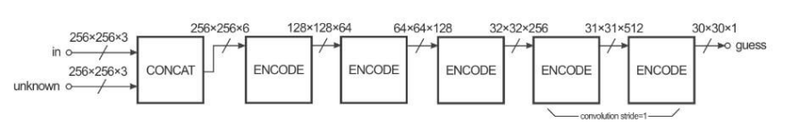  
시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화해보겠습니다.

In [ ]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

이전 PatchGAN에 대해 설명했던 것처럼, 위 (30,30) 크기를 갖는 결과 이미지의 각 픽셀값은 원래 입력의 (70,70) 패치에 대한 분류 결과입니다. 전체 입력의 크기가 (256,256) 이므로, 각각의 (70,70) 패치는 원래 입력상에서 많이 겹쳐있겠죠. 각각의 픽셀값은 `sigmoid` 함수의 결괏값이므로 0~1 사이의 값을 가지며, 진짜 및 가짜 데이터를 판별해내는 데 사용합니다.  

드디어 Pix2Pix를 구성하는 Generator와 Discriminator의 구현이 끝났습니다.  
다음 단계에서 본격적인 모델 학습을 진행해 봅시다!  

## 20-12. 난 스케치를 할 테니 너는 채색을 하거라 (5) 학습 및 테스트하기
이번 단계에서는 구현된 Generator와 Discriminator를 학습시켜보고, 스케치를 입력으로 채색된 이미지를 생성해 봅시다. 먼저 학습에 필요한 손실함수부터 정의하겠습니다.  
논문의 여러 실험 결과 중 손실함수 선택에 따른 결과의 차이는 아래와 같습니다.  

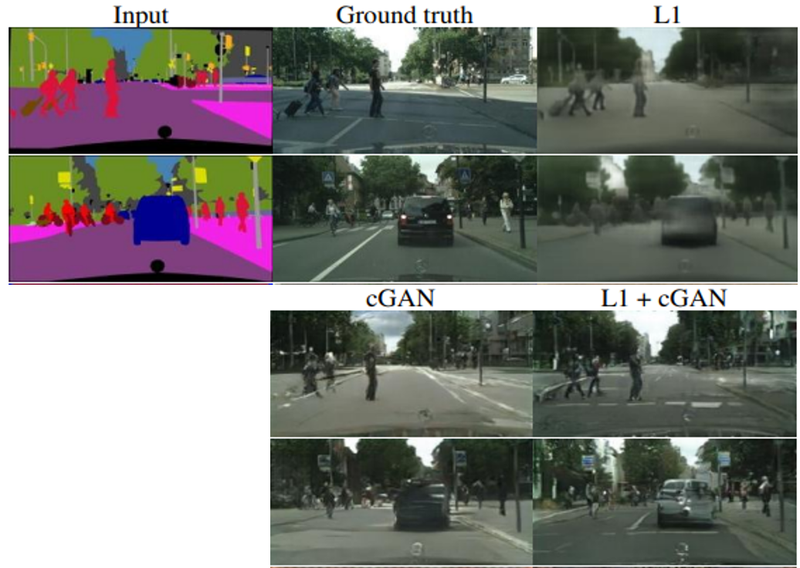  

레이블 정보만 있는 입력에 대해 여러 손실함수를 사용해 실제 이미지를 만들어 낸 결과는, 일반적인 GAN의 손실함수에 L1을 추가로 이용했을 때 가장 실제에 가까운 이미지를 생성해 냈습니다. 이번 실험에서도 두 가지 손실 함수를 모두 사용해 봅시다.  

In [ ]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

Generator 및 Discriminator의 손실 계산을 각각 정의했습니다.  

- Generator의 손실함수 (위 코드의 `get_gene_loss`)는 총 3개의 입력이 있습니다. 이 중 `fake_disc`는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값이며, 실제 이미지를 뜻하는 "1"과 비교하기 위해 `tf.ones_like()`를 사용합니다. 또한 L1 손실을 계산하기 위해 생성한 가짜 이미지(`fake_output`)와 실제 이미지(`real_output`) 사이의 MAE(Mean Absolute Error)를 계산합니다.  

- Discriminator의 손실함수 (위 코드의 `get_disc_loss`)는 2개의 입력이 있으며, 이들은 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값입니다. Discriminator는 실제 이미지를 잘 구분해 내야 하므로 `real_disc`는 "1"로 채워진 벡터와 비교하고, `fake_disc`는 "0"으로 채워진 벡터와 비교합니다.  

사용할 optimizer는 논문과 동일하게 아래와 같이 설정합니다.  

In [ ]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현했습니다.

In [ ]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

전반적인 학습 과정은 앞서 진행했었던 cGAN 학습과 크게 다르지 않습니다.  
다만 위 코드의 `gene_total_loss` 계산 라인에서 최종 Generator 손실을 계산할 때, L1 손실에 100을 곱한 부분을 확인하셨나요? (## 이 표시가 있는 부분을 확인해 주세요.) 논문에서는 Generator의 손실을 아래와 같이 정의했습니다.  
$$G^* = \arg \min_G \max_D \mathcal{L}{cGAN}(G,D) + \lambda \mathcal{L}{L1}(G)$$  


위 식에서 λ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100을 사용했습니다.  
앞서 정의한 함수를 이용해서 학습을 진행합니다. 우선 10 epoch 학습해 봅시다.  

In [ ]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

아래 코드로 짧게나마 학습해 본 모델에 채색을 시켜봅시다. 아마 마음에 안 들 겁니다.. 😥

In [ ]:
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

데이터셋을 제공한 출처를 보면, Pix2Pix로 128 epoch 학습 후 테스트 결과가 아래와 같다고 합니다.  
이전 10 epoch 학습의 결과보다는 훨씬 낫지만, 조금 오래 학습했어도 채색해야 할 전체적인 색감 정도만 학습되며 아직까지 세부적으로는 제대로 채색되지 않다는 것을 확인할 수 있습니다.  

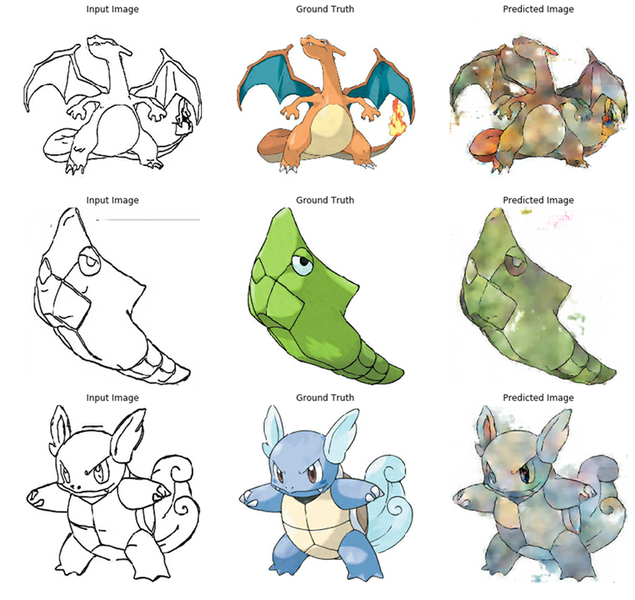

지금까지 꽤 많은 시간을 투자해서 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현까지 이해하느라 고생하셨습니다. 앞서 다뤘던 코드의 이해에 큰 어려움이 없었다면, 연습을 통해 이와 비슷한 구조의 모델들 또한 쉽게 구현할 수 있을 것입니다. (U-Net Generator를 구현했으니 원래 segmentation에 사용되었던 U-Net도 쉽게 구현할 수 있습니다!).  

이번 학습을 통해서 여러분이 Pix2Pix 구조뿐만 아니라 CNN 기반의 어떠한 구조라도 자신을 갖고 구현을 시작할 수 있길 바랍니다.  
마지막으로 다음 단계로 넘어가서 Pix2Pix를 이용한 프로젝트를 수행해봅시다.  

***

# 1. 프로젝트: Segmentation map으로 도로 이미지 만들기
이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.  

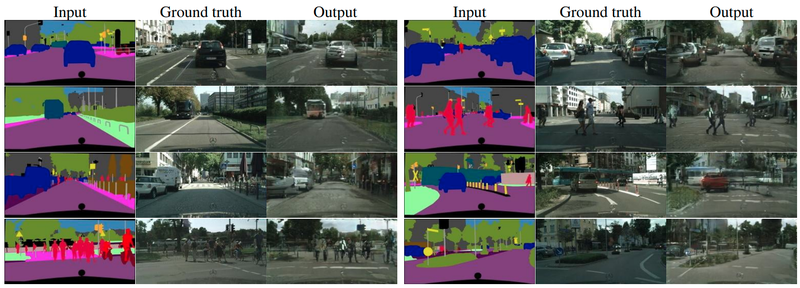  

이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드할 수 있습니다.  
1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.  

[cityscapes.zip ](https://aiffelstaticprd.blob.core.windows.net/media/documents/cityscapes.zip)  

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.  
아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.  

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해봅시다.  
(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)  

- [Tensorflow Pix2Pix Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

### 프로젝트 수행

프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.  
***
1. 데이터에 한 가지 이상의 **augmentation 방법**을 적용하여 학습해주세요.  
    (어떠한 방법을 사용했는지 적어주세요.)
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 **U-Net Generator**를 사용해주세요.  
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운받았던 "val" 폴더 내 이미지를 사용해주세요.  
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화**해 주세요.  
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그**를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

In [1]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

In [2]:
# 데이터 불러오기

data_path = os.getcwd() + '/cityscapes'
train_path = data_path + '/train/'
val_path = data_path + '/val/'

print(train_path)
print(val_path)

/home/aiffel-dj40/1.AIFFEL_Study/Exploration/E20_cGAN/cityscapes/train/
/home/aiffel-dj40/1.AIFFEL_Study/Exploration/E20_cGAN/cityscapes/val/


In [3]:
# 데이터 개수 확인

print('train 이미지 개수: ', len(os.listdir(train_path)))
print('val 이미지 개수: ', len(os.listdir(val_path)))

train 이미지 개수:  1000
val 이미지 개수:  5


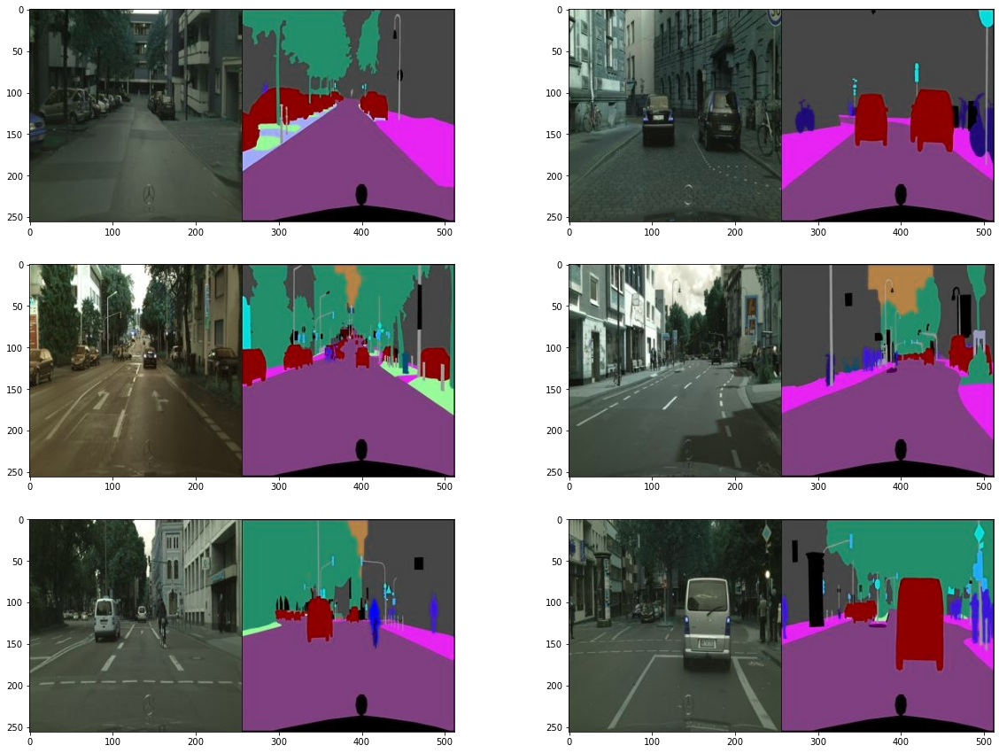

In [4]:
# 데이터 시각화

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [5]:
# 데이터 shape 확인

f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print('이미지 shape는: ', img.shape)

이미지 shape는:  (256, 512, 3)


### 모델에 사용할 데이터를 (256,256,3) 크기로 2개 분리

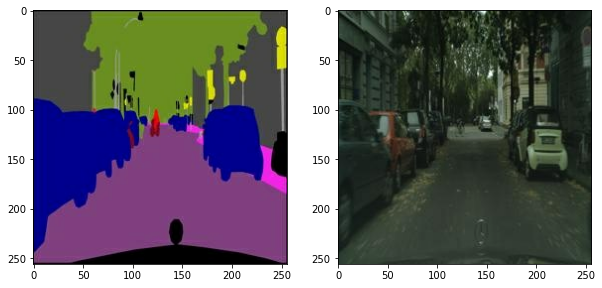

In [6]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = train_path + os.listdir(train_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

### augmentation 적용 (random rotation)

In [7]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


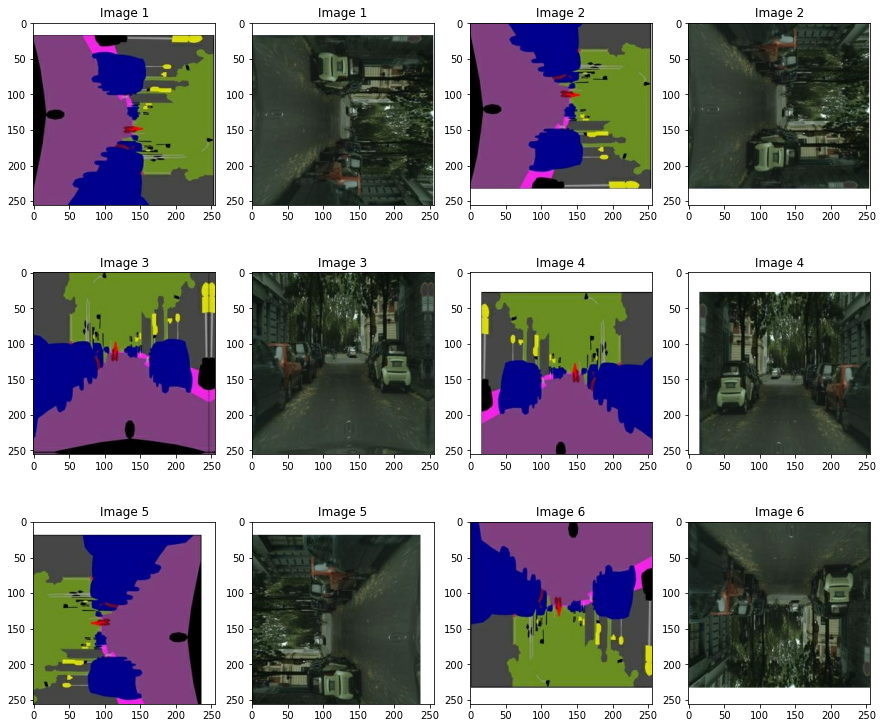

In [8]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

### 전처리 함수

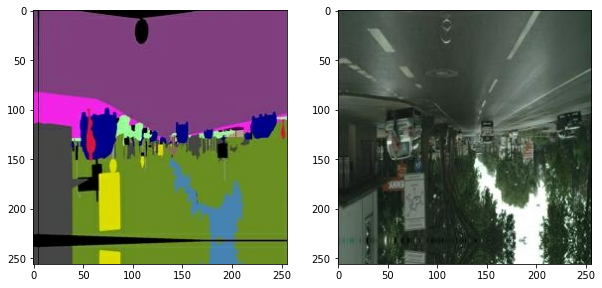

In [9]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

### U-Net Generator

In [10]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


In [11]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [12]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

### Discriminator 구현하기

In [13]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [14]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_15 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


In [15]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [16]:
Discriminator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_3[0][0]                    
                                                                 input_4[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

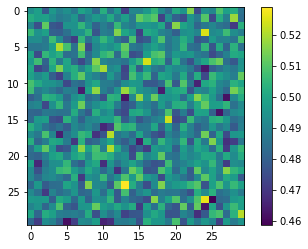

In [17]:
# 시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화

x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

### 학습 및 테스트

In [18]:
# 손실함수

from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [19]:
# Optimizer 정의

from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [20]:
# 하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현

@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


In [21]:
# 학습

EPOCHS = 200

generator = UNetGenerator()
discriminator = Discriminator()

g_loss_list = []
l1_loss_list = []
d_loss_list = []

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            g_loss_list.append(g_loss.numpy())
            l1_loss_list.append(l1_loss.numpy())
            d_loss_list.append(d_loss.numpy())
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.8980                     
L1_loss:0.2939                     
Discriminator_loss:1.2557

EPOCH[1] - STEP[20]                     
Generator_loss:0.8564                     
L1_loss:0.2231                     
Discriminator_loss:1.3341

EPOCH[1] - STEP[30]                     
Generator_loss:0.8383                     
L1_loss:0.2126                     
Discriminator_loss:1.2594

EPOCH[1] - STEP[40]                     
Generator_loss:0.9551                     
L1_loss:0.2514                     
Discriminator_loss:1.2620

EPOCH[1] - STEP[50]                     
Generator_loss:0.6970                     
L1_loss:0.1666                     
Discriminator_loss:1.3215

EPOCH[1] - STEP[60]                     
Generator_loss:0.8858                     
L1_loss:0.1835                     
Discriminator_loss:1.1397

EPOCH[1] - STEP[70]                     
Generator_loss:0.9905                     
L1_loss:0.2441                    

EPOCH[3] - STEP[70]                     
Generator_loss:1.6048                     
L1_loss:0.1819                     
Discriminator_loss:0.3674

EPOCH[3] - STEP[80]                     
Generator_loss:1.0423                     
L1_loss:0.1750                     
Discriminator_loss:0.6376

EPOCH[3] - STEP[90]                     
Generator_loss:1.1826                     
L1_loss:0.1989                     
Discriminator_loss:1.3989

EPOCH[3] - STEP[100]                     
Generator_loss:1.8829                     
L1_loss:0.1659                     
Discriminator_loss:0.5399

EPOCH[3] - STEP[110]                     
Generator_loss:2.6640                     
L1_loss:0.1859                     
Discriminator_loss:0.5614

EPOCH[3] - STEP[120]                     
Generator_loss:0.8054                     
L1_loss:0.1798                     
Discriminator_loss:0.8644

EPOCH[3] - STEP[130]                     
Generator_loss:2.0752                     
L1_loss:0.1685                

EPOCH[5] - STEP[130]                     
Generator_loss:1.2357                     
L1_loss:0.1702                     
Discriminator_loss:0.7631

EPOCH[5] - STEP[140]                     
Generator_loss:1.9672                     
L1_loss:0.1802                     
Discriminator_loss:0.7179

EPOCH[5] - STEP[150]                     
Generator_loss:1.9254                     
L1_loss:0.1607                     
Discriminator_loss:1.2591

EPOCH[5] - STEP[160]                     
Generator_loss:1.0318                     
L1_loss:0.1753                     
Discriminator_loss:0.5725

EPOCH[5] - STEP[170]                     
Generator_loss:3.1757                     
L1_loss:0.1573                     
Discriminator_loss:1.5936

EPOCH[5] - STEP[180]                     
Generator_loss:1.2310                     
L1_loss:0.1616                     
Discriminator_loss:0.7992

EPOCH[5] - STEP[190]                     
Generator_loss:0.7820                     
L1_loss:0.1652             

EPOCH[7] - STEP[190]                     
Generator_loss:0.8262                     
L1_loss:0.1757                     
Discriminator_loss:1.0739

EPOCH[7] - STEP[200]                     
Generator_loss:0.5612                     
L1_loss:0.2034                     
Discriminator_loss:0.9325

EPOCH[7] - STEP[210]                     
Generator_loss:1.6009                     
L1_loss:0.1575                     
Discriminator_loss:0.9709

EPOCH[7] - STEP[220]                     
Generator_loss:1.2400                     
L1_loss:0.1820                     
Discriminator_loss:0.6035

EPOCH[7] - STEP[230]                     
Generator_loss:1.7228                     
L1_loss:0.1764                     
Discriminator_loss:2.1208

EPOCH[7] - STEP[240]                     
Generator_loss:0.9369                     
L1_loss:0.1447                     
Discriminator_loss:0.9986

EPOCH[7] - STEP[250]                     
Generator_loss:1.5643                     
L1_loss:0.1730             

EPOCH[9] - STEP[250]                     
Generator_loss:1.2499                     
L1_loss:0.1745                     
Discriminator_loss:0.8148

EPOCH[10] - STEP[10]                     
Generator_loss:2.2483                     
L1_loss:0.1932                     
Discriminator_loss:0.1869

EPOCH[10] - STEP[20]                     
Generator_loss:2.8399                     
L1_loss:0.1902                     
Discriminator_loss:0.3468

EPOCH[10] - STEP[30]                     
Generator_loss:1.2747                     
L1_loss:0.1953                     
Discriminator_loss:0.6047

EPOCH[10] - STEP[40]                     
Generator_loss:0.2737                     
L1_loss:0.1962                     
Discriminator_loss:2.4985

EPOCH[10] - STEP[50]                     
Generator_loss:0.9064                     
L1_loss:0.1486                     
Discriminator_loss:0.8990

EPOCH[10] - STEP[60]                     
Generator_loss:0.9458                     
L1_loss:0.1729             

EPOCH[12] - STEP[60]                     
Generator_loss:0.6935                     
L1_loss:0.1942                     
Discriminator_loss:1.3326

EPOCH[12] - STEP[70]                     
Generator_loss:1.8940                     
L1_loss:0.1756                     
Discriminator_loss:0.9640

EPOCH[12] - STEP[80]                     
Generator_loss:0.9672                     
L1_loss:0.1826                     
Discriminator_loss:0.8047

EPOCH[12] - STEP[90]                     
Generator_loss:1.3696                     
L1_loss:0.1787                     
Discriminator_loss:0.4017

EPOCH[12] - STEP[100]                     
Generator_loss:2.7246                     
L1_loss:0.1694                     
Discriminator_loss:1.1731

EPOCH[12] - STEP[110]                     
Generator_loss:2.4193                     
L1_loss:0.1823                     
Discriminator_loss:0.2593

EPOCH[12] - STEP[120]                     
Generator_loss:1.2135                     
L1_loss:0.1804          

EPOCH[14] - STEP[120]                     
Generator_loss:1.5172                     
L1_loss:0.1738                     
Discriminator_loss:2.4080

EPOCH[14] - STEP[130]                     
Generator_loss:1.7203                     
L1_loss:0.1776                     
Discriminator_loss:0.5351

EPOCH[14] - STEP[140]                     
Generator_loss:2.9712                     
L1_loss:0.1587                     
Discriminator_loss:1.5399

EPOCH[14] - STEP[150]                     
Generator_loss:1.6859                     
L1_loss:0.1875                     
Discriminator_loss:0.4213

EPOCH[14] - STEP[160]                     
Generator_loss:1.2887                     
L1_loss:0.1602                     
Discriminator_loss:1.3722

EPOCH[14] - STEP[170]                     
Generator_loss:0.9660                     
L1_loss:0.1499                     
Discriminator_loss:0.7839

EPOCH[14] - STEP[180]                     
Generator_loss:1.5513                     
L1_loss:0.1734      

EPOCH[16] - STEP[180]                     
Generator_loss:1.0997                     
L1_loss:0.2275                     
Discriminator_loss:1.1833

EPOCH[16] - STEP[190]                     
Generator_loss:2.5090                     
L1_loss:0.2008                     
Discriminator_loss:0.2916

EPOCH[16] - STEP[200]                     
Generator_loss:1.5542                     
L1_loss:0.2354                     
Discriminator_loss:0.2713

EPOCH[16] - STEP[210]                     
Generator_loss:1.7244                     
L1_loss:0.1658                     
Discriminator_loss:1.0109

EPOCH[16] - STEP[220]                     
Generator_loss:1.1346                     
L1_loss:0.1792                     
Discriminator_loss:1.5245

EPOCH[16] - STEP[230]                     
Generator_loss:0.8333                     
L1_loss:0.1754                     
Discriminator_loss:0.9167

EPOCH[16] - STEP[240]                     
Generator_loss:1.8392                     
L1_loss:0.1671      

EPOCH[18] - STEP[240]                     
Generator_loss:2.1077                     
L1_loss:0.1602                     
Discriminator_loss:0.2995

EPOCH[18] - STEP[250]                     
Generator_loss:1.3968                     
L1_loss:0.1884                     
Discriminator_loss:0.5252

EPOCH[19] - STEP[10]                     
Generator_loss:0.5979                     
L1_loss:0.1874                     
Discriminator_loss:0.9648

EPOCH[19] - STEP[20]                     
Generator_loss:1.5449                     
L1_loss:0.2045                     
Discriminator_loss:0.7558

EPOCH[19] - STEP[30]                     
Generator_loss:0.7439                     
L1_loss:0.1881                     
Discriminator_loss:0.7953

EPOCH[19] - STEP[40]                     
Generator_loss:1.0680                     
L1_loss:0.1785                     
Discriminator_loss:1.5561

EPOCH[19] - STEP[50]                     
Generator_loss:2.8061                     
L1_loss:0.1956           

EPOCH[21] - STEP[50]                     
Generator_loss:1.2759                     
L1_loss:0.1651                     
Discriminator_loss:0.6461

EPOCH[21] - STEP[60]                     
Generator_loss:1.9192                     
L1_loss:0.1821                     
Discriminator_loss:1.0494

EPOCH[21] - STEP[70]                     
Generator_loss:1.1241                     
L1_loss:0.1637                     
Discriminator_loss:0.5973

EPOCH[21] - STEP[80]                     
Generator_loss:0.7639                     
L1_loss:0.1726                     
Discriminator_loss:0.9127

EPOCH[21] - STEP[90]                     
Generator_loss:1.6747                     
L1_loss:0.1700                     
Discriminator_loss:0.7153

EPOCH[21] - STEP[100]                     
Generator_loss:0.8733                     
L1_loss:0.1936                     
Discriminator_loss:0.7690

EPOCH[21] - STEP[110]                     
Generator_loss:1.1530                     
L1_loss:0.1739           

EPOCH[23] - STEP[110]                     
Generator_loss:1.6757                     
L1_loss:0.1685                     
Discriminator_loss:0.6492

EPOCH[23] - STEP[120]                     
Generator_loss:0.7183                     
L1_loss:0.1814                     
Discriminator_loss:1.5805

EPOCH[23] - STEP[130]                     
Generator_loss:1.0169                     
L1_loss:0.1736                     
Discriminator_loss:0.7853

EPOCH[23] - STEP[140]                     
Generator_loss:0.7278                     
L1_loss:0.1255                     
Discriminator_loss:1.7333

EPOCH[23] - STEP[150]                     
Generator_loss:1.1793                     
L1_loss:0.1337                     
Discriminator_loss:0.8526

EPOCH[23] - STEP[160]                     
Generator_loss:1.3437                     
L1_loss:0.2016                     
Discriminator_loss:0.4854

EPOCH[23] - STEP[170]                     
Generator_loss:1.0201                     
L1_loss:0.1886      

EPOCH[25] - STEP[170]                     
Generator_loss:1.4968                     
L1_loss:0.1504                     
Discriminator_loss:0.8997

EPOCH[25] - STEP[180]                     
Generator_loss:1.0103                     
L1_loss:0.1534                     
Discriminator_loss:0.9346

EPOCH[25] - STEP[190]                     
Generator_loss:1.6821                     
L1_loss:0.1749                     
Discriminator_loss:0.5893

EPOCH[25] - STEP[200]                     
Generator_loss:1.9857                     
L1_loss:0.1754                     
Discriminator_loss:0.4266

EPOCH[25] - STEP[210]                     
Generator_loss:1.3940                     
L1_loss:0.1857                     
Discriminator_loss:0.4837

EPOCH[25] - STEP[220]                     
Generator_loss:0.9882                     
L1_loss:0.2029                     
Discriminator_loss:1.1642

EPOCH[25] - STEP[230]                     
Generator_loss:1.8172                     
L1_loss:0.1869      

EPOCH[27] - STEP[230]                     
Generator_loss:1.1122                     
L1_loss:0.1733                     
Discriminator_loss:0.7193

EPOCH[27] - STEP[240]                     
Generator_loss:2.9613                     
L1_loss:0.1624                     
Discriminator_loss:1.2326

EPOCH[27] - STEP[250]                     
Generator_loss:2.3140                     
L1_loss:0.1788                     
Discriminator_loss:1.5955

EPOCH[28] - STEP[10]                     
Generator_loss:2.2898                     
L1_loss:0.2037                     
Discriminator_loss:0.1766

EPOCH[28] - STEP[20]                     
Generator_loss:0.9332                     
L1_loss:0.1726                     
Discriminator_loss:0.9873

EPOCH[28] - STEP[30]                     
Generator_loss:0.8505                     
L1_loss:0.1629                     
Discriminator_loss:1.4280

EPOCH[28] - STEP[40]                     
Generator_loss:1.1247                     
L1_loss:0.1848          

EPOCH[30] - STEP[40]                     
Generator_loss:1.4664                     
L1_loss:0.1715                     
Discriminator_loss:1.1301

EPOCH[30] - STEP[50]                     
Generator_loss:0.6844                     
L1_loss:0.1546                     
Discriminator_loss:0.9740

EPOCH[30] - STEP[60]                     
Generator_loss:0.8636                     
L1_loss:0.2134                     
Discriminator_loss:0.7286

EPOCH[30] - STEP[70]                     
Generator_loss:1.9721                     
L1_loss:0.1939                     
Discriminator_loss:0.5313

EPOCH[30] - STEP[80]                     
Generator_loss:1.3467                     
L1_loss:0.1865                     
Discriminator_loss:0.5455

EPOCH[30] - STEP[90]                     
Generator_loss:1.5391                     
L1_loss:0.1641                     
Discriminator_loss:0.5582

EPOCH[30] - STEP[100]                     
Generator_loss:1.4659                     
L1_loss:0.2083            

EPOCH[32] - STEP[100]                     
Generator_loss:0.9415                     
L1_loss:0.1580                     
Discriminator_loss:2.1125

EPOCH[32] - STEP[110]                     
Generator_loss:2.4609                     
L1_loss:0.2022                     
Discriminator_loss:0.2034

EPOCH[32] - STEP[120]                     
Generator_loss:2.1716                     
L1_loss:0.1474                     
Discriminator_loss:1.2367

EPOCH[32] - STEP[130]                     
Generator_loss:2.1522                     
L1_loss:0.1947                     
Discriminator_loss:0.2675

EPOCH[32] - STEP[140]                     
Generator_loss:0.9357                     
L1_loss:0.1950                     
Discriminator_loss:0.7348

EPOCH[32] - STEP[150]                     
Generator_loss:2.4885                     
L1_loss:0.1778                     
Discriminator_loss:0.3600

EPOCH[32] - STEP[160]                     
Generator_loss:1.5448                     
L1_loss:0.1687      

EPOCH[34] - STEP[160]                     
Generator_loss:1.9326                     
L1_loss:0.1809                     
Discriminator_loss:0.2251

EPOCH[34] - STEP[170]                     
Generator_loss:0.5500                     
L1_loss:0.2061                     
Discriminator_loss:1.0092

EPOCH[34] - STEP[180]                     
Generator_loss:1.7631                     
L1_loss:0.1980                     
Discriminator_loss:0.2696

EPOCH[34] - STEP[190]                     
Generator_loss:1.8004                     
L1_loss:0.1745                     
Discriminator_loss:0.6388

EPOCH[34] - STEP[200]                     
Generator_loss:2.0790                     
L1_loss:0.1909                     
Discriminator_loss:0.1814

EPOCH[34] - STEP[210]                     
Generator_loss:0.9310                     
L1_loss:0.1854                     
Discriminator_loss:1.0200

EPOCH[34] - STEP[220]                     
Generator_loss:1.5315                     
L1_loss:0.1599      

EPOCH[36] - STEP[220]                     
Generator_loss:0.8171                     
L1_loss:0.1999                     
Discriminator_loss:0.7267

EPOCH[36] - STEP[230]                     
Generator_loss:1.2240                     
L1_loss:0.1594                     
Discriminator_loss:1.7398

EPOCH[36] - STEP[240]                     
Generator_loss:2.1075                     
L1_loss:0.1792                     
Discriminator_loss:0.2214

EPOCH[36] - STEP[250]                     
Generator_loss:1.5455                     
L1_loss:0.1860                     
Discriminator_loss:1.0878

EPOCH[37] - STEP[10]                     
Generator_loss:2.9025                     
L1_loss:0.1913                     
Discriminator_loss:1.6859

EPOCH[37] - STEP[20]                     
Generator_loss:0.8653                     
L1_loss:0.1838                     
Discriminator_loss:0.9118

EPOCH[37] - STEP[30]                     
Generator_loss:2.1620                     
L1_loss:0.1619         

EPOCH[39] - STEP[30]                     
Generator_loss:1.0425                     
L1_loss:0.1750                     
Discriminator_loss:0.6489

EPOCH[39] - STEP[40]                     
Generator_loss:1.3026                     
L1_loss:0.2153                     
Discriminator_loss:0.3756

EPOCH[39] - STEP[50]                     
Generator_loss:0.4016                     
L1_loss:0.1832                     
Discriminator_loss:1.3457

EPOCH[39] - STEP[60]                     
Generator_loss:1.4487                     
L1_loss:0.1543                     
Discriminator_loss:1.2031

EPOCH[39] - STEP[70]                     
Generator_loss:1.2268                     
L1_loss:0.1693                     
Discriminator_loss:0.8820

EPOCH[39] - STEP[80]                     
Generator_loss:1.2542                     
L1_loss:0.1537                     
Discriminator_loss:0.5157

EPOCH[39] - STEP[90]                     
Generator_loss:1.4872                     
L1_loss:0.1618             

EPOCH[41] - STEP[90]                     
Generator_loss:1.0693                     
L1_loss:0.1701                     
Discriminator_loss:0.7665

EPOCH[41] - STEP[100]                     
Generator_loss:2.6101                     
L1_loss:0.1607                     
Discriminator_loss:0.2649

EPOCH[41] - STEP[110]                     
Generator_loss:0.8626                     
L1_loss:0.1678                     
Discriminator_loss:0.7072

EPOCH[41] - STEP[120]                     
Generator_loss:0.9240                     
L1_loss:0.2064                     
Discriminator_loss:0.6144

EPOCH[41] - STEP[130]                     
Generator_loss:1.0992                     
L1_loss:0.1935                     
Discriminator_loss:0.8688

EPOCH[41] - STEP[140]                     
Generator_loss:2.3587                     
L1_loss:0.1859                     
Discriminator_loss:0.4851

EPOCH[41] - STEP[150]                     
Generator_loss:1.2533                     
L1_loss:0.1949       

EPOCH[43] - STEP[150]                     
Generator_loss:1.0083                     
L1_loss:0.1560                     
Discriminator_loss:1.6107

EPOCH[43] - STEP[160]                     
Generator_loss:0.8868                     
L1_loss:0.1722                     
Discriminator_loss:0.7711

EPOCH[43] - STEP[170]                     
Generator_loss:1.2940                     
L1_loss:0.1855                     
Discriminator_loss:0.4350

EPOCH[43] - STEP[180]                     
Generator_loss:1.2290                     
L1_loss:0.1868                     
Discriminator_loss:0.5589

EPOCH[43] - STEP[190]                     
Generator_loss:0.7920                     
L1_loss:0.1980                     
Discriminator_loss:0.7996

EPOCH[43] - STEP[200]                     
Generator_loss:1.7447                     
L1_loss:0.1684                     
Discriminator_loss:0.2875

EPOCH[43] - STEP[210]                     
Generator_loss:0.4419                     
L1_loss:0.1710      

EPOCH[45] - STEP[210]                     
Generator_loss:1.9489                     
L1_loss:0.1615                     
Discriminator_loss:1.2678

EPOCH[45] - STEP[220]                     
Generator_loss:2.1152                     
L1_loss:0.1495                     
Discriminator_loss:0.9814

EPOCH[45] - STEP[230]                     
Generator_loss:2.7082                     
L1_loss:0.1871                     
Discriminator_loss:0.9054

EPOCH[45] - STEP[240]                     
Generator_loss:2.2014                     
L1_loss:0.2087                     
Discriminator_loss:0.3041

EPOCH[45] - STEP[250]                     
Generator_loss:2.7929                     
L1_loss:0.1493                     
Discriminator_loss:1.4475

EPOCH[46] - STEP[10]                     
Generator_loss:0.3695                     
L1_loss:0.1784                     
Discriminator_loss:1.6265

EPOCH[46] - STEP[20]                     
Generator_loss:1.9220                     
L1_loss:0.2160        

EPOCH[48] - STEP[20]                     
Generator_loss:2.1425                     
L1_loss:0.1668                     
Discriminator_loss:0.2637

EPOCH[48] - STEP[30]                     
Generator_loss:1.7557                     
L1_loss:0.1865                     
Discriminator_loss:1.1248

EPOCH[48] - STEP[40]                     
Generator_loss:1.5044                     
L1_loss:0.1506                     
Discriminator_loss:1.0853

EPOCH[48] - STEP[50]                     
Generator_loss:0.5345                     
L1_loss:0.1759                     
Discriminator_loss:1.0435

EPOCH[48] - STEP[60]                     
Generator_loss:1.8146                     
L1_loss:0.1855                     
Discriminator_loss:0.3104

EPOCH[48] - STEP[70]                     
Generator_loss:0.3427                     
L1_loss:0.2116                     
Discriminator_loss:1.4447

EPOCH[48] - STEP[80]                     
Generator_loss:0.9884                     
L1_loss:0.1655             

EPOCH[50] - STEP[80]                     
Generator_loss:0.9249                     
L1_loss:0.1929                     
Discriminator_loss:0.6763

EPOCH[50] - STEP[90]                     
Generator_loss:0.4192                     
L1_loss:0.1573                     
Discriminator_loss:1.2238

EPOCH[50] - STEP[100]                     
Generator_loss:1.6800                     
L1_loss:0.1869                     
Discriminator_loss:1.7295

EPOCH[50] - STEP[110]                     
Generator_loss:1.8541                     
L1_loss:0.1690                     
Discriminator_loss:0.7622

EPOCH[50] - STEP[120]                     
Generator_loss:2.2063                     
L1_loss:0.1952                     
Discriminator_loss:0.4336

EPOCH[50] - STEP[130]                     
Generator_loss:1.8590                     
L1_loss:0.1610                     
Discriminator_loss:0.2395

EPOCH[50] - STEP[140]                     
Generator_loss:1.0108                     
L1_loss:0.1836        

EPOCH[52] - STEP[140]                     
Generator_loss:2.1757                     
L1_loss:0.1706                     
Discriminator_loss:1.0431

EPOCH[52] - STEP[150]                     
Generator_loss:2.2497                     
L1_loss:0.1596                     
Discriminator_loss:2.2707

EPOCH[52] - STEP[160]                     
Generator_loss:0.7586                     
L1_loss:0.1939                     
Discriminator_loss:1.0434

EPOCH[52] - STEP[170]                     
Generator_loss:1.6221                     
L1_loss:0.1627                     
Discriminator_loss:1.4188

EPOCH[52] - STEP[180]                     
Generator_loss:0.7699                     
L1_loss:0.1576                     
Discriminator_loss:1.1365

EPOCH[52] - STEP[190]                     
Generator_loss:1.4459                     
L1_loss:0.1893                     
Discriminator_loss:0.3387

EPOCH[52] - STEP[200]                     
Generator_loss:0.3588                     
L1_loss:0.1943      

EPOCH[54] - STEP[200]                     
Generator_loss:2.0507                     
L1_loss:0.1507                     
Discriminator_loss:0.7692

EPOCH[54] - STEP[210]                     
Generator_loss:1.8357                     
L1_loss:0.2153                     
Discriminator_loss:0.6117

EPOCH[54] - STEP[220]                     
Generator_loss:2.2950                     
L1_loss:0.1818                     
Discriminator_loss:1.6104

EPOCH[54] - STEP[230]                     
Generator_loss:0.6736                     
L1_loss:0.1631                     
Discriminator_loss:0.9612

EPOCH[54] - STEP[240]                     
Generator_loss:1.7631                     
L1_loss:0.1709                     
Discriminator_loss:0.7724

EPOCH[54] - STEP[250]                     
Generator_loss:1.2271                     
L1_loss:0.1648                     
Discriminator_loss:1.6503

EPOCH[55] - STEP[10]                     
Generator_loss:1.6724                     
L1_loss:0.1505       

EPOCH[57] - STEP[10]                     
Generator_loss:2.3607                     
L1_loss:0.1782                     
Discriminator_loss:1.3625

EPOCH[57] - STEP[20]                     
Generator_loss:1.1802                     
L1_loss:0.1537                     
Discriminator_loss:0.6513

EPOCH[57] - STEP[30]                     
Generator_loss:1.2739                     
L1_loss:0.1749                     
Discriminator_loss:0.4704

EPOCH[57] - STEP[40]                     
Generator_loss:0.5303                     
L1_loss:0.1718                     
Discriminator_loss:1.5394

EPOCH[57] - STEP[50]                     
Generator_loss:1.7191                     
L1_loss:0.1788                     
Discriminator_loss:0.2999

EPOCH[57] - STEP[60]                     
Generator_loss:2.5150                     
L1_loss:0.1735                     
Discriminator_loss:1.0458

EPOCH[57] - STEP[70]                     
Generator_loss:1.1970                     
L1_loss:0.1821             

EPOCH[59] - STEP[70]                     
Generator_loss:1.4217                     
L1_loss:0.1846                     
Discriminator_loss:1.8210

EPOCH[59] - STEP[80]                     
Generator_loss:2.1506                     
L1_loss:0.1783                     
Discriminator_loss:0.5289

EPOCH[59] - STEP[90]                     
Generator_loss:0.9326                     
L1_loss:0.1696                     
Discriminator_loss:0.9223

EPOCH[59] - STEP[100]                     
Generator_loss:1.7136                     
L1_loss:0.1676                     
Discriminator_loss:0.9186

EPOCH[59] - STEP[110]                     
Generator_loss:1.0360                     
L1_loss:0.1619                     
Discriminator_loss:0.9278

EPOCH[59] - STEP[120]                     
Generator_loss:2.1770                     
L1_loss:0.1877                     
Discriminator_loss:0.2118

EPOCH[59] - STEP[130]                     
Generator_loss:0.6106                     
L1_loss:0.1738         

EPOCH[61] - STEP[130]                     
Generator_loss:2.8677                     
L1_loss:0.1830                     
Discriminator_loss:0.4211

EPOCH[61] - STEP[140]                     
Generator_loss:1.4589                     
L1_loss:0.1697                     
Discriminator_loss:0.3817

EPOCH[61] - STEP[150]                     
Generator_loss:1.6392                     
L1_loss:0.1764                     
Discriminator_loss:0.6514

EPOCH[61] - STEP[160]                     
Generator_loss:1.7120                     
L1_loss:0.1592                     
Discriminator_loss:1.9394

EPOCH[61] - STEP[170]                     
Generator_loss:2.9853                     
L1_loss:0.1722                     
Discriminator_loss:1.3532

EPOCH[61] - STEP[180]                     
Generator_loss:2.1129                     
L1_loss:0.2276                     
Discriminator_loss:0.1559

EPOCH[61] - STEP[190]                     
Generator_loss:1.1245                     
L1_loss:0.1699      

EPOCH[63] - STEP[190]                     
Generator_loss:1.6930                     
L1_loss:0.1732                     
Discriminator_loss:0.5623

EPOCH[63] - STEP[200]                     
Generator_loss:0.8624                     
L1_loss:0.1896                     
Discriminator_loss:0.7411

EPOCH[63] - STEP[210]                     
Generator_loss:1.5703                     
L1_loss:0.1610                     
Discriminator_loss:0.9531

EPOCH[63] - STEP[220]                     
Generator_loss:1.6112                     
L1_loss:0.1363                     
Discriminator_loss:1.6302

EPOCH[63] - STEP[230]                     
Generator_loss:3.5788                     
L1_loss:0.1910                     
Discriminator_loss:1.0537

EPOCH[63] - STEP[240]                     
Generator_loss:1.3198                     
L1_loss:0.1638                     
Discriminator_loss:0.5283

EPOCH[63] - STEP[250]                     
Generator_loss:2.1407                     
L1_loss:0.1741      

EPOCH[65] - STEP[250]                     
Generator_loss:1.5177                     
L1_loss:0.1681                     
Discriminator_loss:1.1184

EPOCH[66] - STEP[10]                     
Generator_loss:1.1362                     
L1_loss:0.1931                     
Discriminator_loss:0.6683

EPOCH[66] - STEP[20]                     
Generator_loss:0.4386                     
L1_loss:0.1763                     
Discriminator_loss:1.2167

EPOCH[66] - STEP[30]                     
Generator_loss:1.5519                     
L1_loss:0.1437                     
Discriminator_loss:0.4512

EPOCH[66] - STEP[40]                     
Generator_loss:1.8632                     
L1_loss:0.1775                     
Discriminator_loss:0.2955

EPOCH[66] - STEP[50]                     
Generator_loss:0.5668                     
L1_loss:0.2103                     
Discriminator_loss:1.4457

EPOCH[66] - STEP[60]                     
Generator_loss:1.7063                     
L1_loss:0.1478            

EPOCH[68] - STEP[60]                     
Generator_loss:0.8357                     
L1_loss:0.1560                     
Discriminator_loss:1.0708

EPOCH[68] - STEP[70]                     
Generator_loss:0.8627                     
L1_loss:0.1958                     
Discriminator_loss:0.6995

EPOCH[68] - STEP[80]                     
Generator_loss:0.6289                     
L1_loss:0.1680                     
Discriminator_loss:0.9370

EPOCH[68] - STEP[90]                     
Generator_loss:1.8415                     
L1_loss:0.1646                     
Discriminator_loss:1.5012

EPOCH[68] - STEP[100]                     
Generator_loss:0.6045                     
L1_loss:0.1469                     
Discriminator_loss:2.4714

EPOCH[68] - STEP[110]                     
Generator_loss:1.6727                     
L1_loss:0.1456                     
Discriminator_loss:1.1186

EPOCH[68] - STEP[120]                     
Generator_loss:1.0050                     
L1_loss:0.2017          

EPOCH[70] - STEP[120]                     
Generator_loss:1.8238                     
L1_loss:0.1947                     
Discriminator_loss:0.2652

EPOCH[70] - STEP[130]                     
Generator_loss:1.7462                     
L1_loss:0.1685                     
Discriminator_loss:1.3910

EPOCH[70] - STEP[140]                     
Generator_loss:0.8922                     
L1_loss:0.1732                     
Discriminator_loss:0.6414

EPOCH[70] - STEP[150]                     
Generator_loss:2.4456                     
L1_loss:0.1425                     
Discriminator_loss:1.4477

EPOCH[70] - STEP[160]                     
Generator_loss:1.6816                     
L1_loss:0.2230                     
Discriminator_loss:0.2949

EPOCH[70] - STEP[170]                     
Generator_loss:0.6179                     
L1_loss:0.1727                     
Discriminator_loss:1.2158

EPOCH[70] - STEP[180]                     
Generator_loss:1.0583                     
L1_loss:0.1809      

EPOCH[72] - STEP[180]                     
Generator_loss:1.1739                     
L1_loss:0.1543                     
Discriminator_loss:0.6989

EPOCH[72] - STEP[190]                     
Generator_loss:1.5968                     
L1_loss:0.1466                     
Discriminator_loss:0.6389

EPOCH[72] - STEP[200]                     
Generator_loss:2.0990                     
L1_loss:0.1911                     
Discriminator_loss:0.2746

EPOCH[72] - STEP[210]                     
Generator_loss:1.7368                     
L1_loss:0.1396                     
Discriminator_loss:0.9534

EPOCH[72] - STEP[220]                     
Generator_loss:0.5439                     
L1_loss:0.2052                     
Discriminator_loss:1.0594

EPOCH[72] - STEP[230]                     
Generator_loss:1.5109                     
L1_loss:0.1317                     
Discriminator_loss:1.3398

EPOCH[72] - STEP[240]                     
Generator_loss:2.6591                     
L1_loss:0.1923      

EPOCH[74] - STEP[240]                     
Generator_loss:1.4885                     
L1_loss:0.1839                     
Discriminator_loss:0.3985

EPOCH[74] - STEP[250]                     
Generator_loss:1.3140                     
L1_loss:0.1699                     
Discriminator_loss:1.5415

EPOCH[75] - STEP[10]                     
Generator_loss:1.2237                     
L1_loss:0.1705                     
Discriminator_loss:0.4267

EPOCH[75] - STEP[20]                     
Generator_loss:1.4865                     
L1_loss:0.1655                     
Discriminator_loss:0.8453

EPOCH[75] - STEP[30]                     
Generator_loss:1.1153                     
L1_loss:0.1928                     
Discriminator_loss:0.5562

EPOCH[75] - STEP[40]                     
Generator_loss:1.8744                     
L1_loss:0.1645                     
Discriminator_loss:0.9762

EPOCH[75] - STEP[50]                     
Generator_loss:1.9587                     
L1_loss:0.1505           

EPOCH[77] - STEP[50]                     
Generator_loss:1.6996                     
L1_loss:0.1613                     
Discriminator_loss:0.5645

EPOCH[77] - STEP[60]                     
Generator_loss:0.7948                     
L1_loss:0.1544                     
Discriminator_loss:1.5310

EPOCH[77] - STEP[70]                     
Generator_loss:0.6179                     
L1_loss:0.1557                     
Discriminator_loss:1.6643

EPOCH[77] - STEP[80]                     
Generator_loss:0.1642                     
L1_loss:0.1908                     
Discriminator_loss:2.7188

EPOCH[77] - STEP[90]                     
Generator_loss:1.8797                     
L1_loss:0.1555                     
Discriminator_loss:0.5395

EPOCH[77] - STEP[100]                     
Generator_loss:1.4337                     
L1_loss:0.1669                     
Discriminator_loss:1.4118

EPOCH[77] - STEP[110]                     
Generator_loss:1.1854                     
L1_loss:0.1701           

EPOCH[79] - STEP[110]                     
Generator_loss:2.4911                     
L1_loss:0.1810                     
Discriminator_loss:0.1669

EPOCH[79] - STEP[120]                     
Generator_loss:2.0470                     
L1_loss:0.1956                     
Discriminator_loss:0.2005

EPOCH[79] - STEP[130]                     
Generator_loss:1.9695                     
L1_loss:0.1647                     
Discriminator_loss:0.4149

EPOCH[79] - STEP[140]                     
Generator_loss:1.5672                     
L1_loss:0.1999                     
Discriminator_loss:0.3219

EPOCH[79] - STEP[150]                     
Generator_loss:1.8466                     
L1_loss:0.1366                     
Discriminator_loss:1.1818

EPOCH[79] - STEP[160]                     
Generator_loss:0.5891                     
L1_loss:0.1659                     
Discriminator_loss:0.9793

EPOCH[79] - STEP[170]                     
Generator_loss:1.9947                     
L1_loss:0.1929      

EPOCH[81] - STEP[170]                     
Generator_loss:1.7632                     
L1_loss:0.1709                     
Discriminator_loss:0.7138

EPOCH[81] - STEP[180]                     
Generator_loss:0.7165                     
L1_loss:0.2409                     
Discriminator_loss:0.8378

EPOCH[81] - STEP[190]                     
Generator_loss:2.3949                     
L1_loss:0.1441                     
Discriminator_loss:1.2966

EPOCH[81] - STEP[200]                     
Generator_loss:1.0504                     
L1_loss:0.1594                     
Discriminator_loss:0.6313

EPOCH[81] - STEP[210]                     
Generator_loss:1.8529                     
L1_loss:0.2002                     
Discriminator_loss:0.2106

EPOCH[81] - STEP[220]                     
Generator_loss:1.5498                     
L1_loss:0.1711                     
Discriminator_loss:0.7613

EPOCH[81] - STEP[230]                     
Generator_loss:1.1839                     
L1_loss:0.1943      

EPOCH[83] - STEP[230]                     
Generator_loss:1.6078                     
L1_loss:0.1527                     
Discriminator_loss:1.2243

EPOCH[83] - STEP[240]                     
Generator_loss:0.8579                     
L1_loss:0.2123                     
Discriminator_loss:0.8544

EPOCH[83] - STEP[250]                     
Generator_loss:1.5783                     
L1_loss:0.1645                     
Discriminator_loss:1.5354

EPOCH[84] - STEP[10]                     
Generator_loss:2.0623                     
L1_loss:0.1833                     
Discriminator_loss:0.7579

EPOCH[84] - STEP[20]                     
Generator_loss:1.4929                     
L1_loss:0.1624                     
Discriminator_loss:0.6646

EPOCH[84] - STEP[30]                     
Generator_loss:1.0812                     
L1_loss:0.1723                     
Discriminator_loss:0.9919

EPOCH[84] - STEP[40]                     
Generator_loss:1.6836                     
L1_loss:0.1809          

EPOCH[86] - STEP[40]                     
Generator_loss:1.2407                     
L1_loss:0.1654                     
Discriminator_loss:1.9617

EPOCH[86] - STEP[50]                     
Generator_loss:1.0666                     
L1_loss:0.1586                     
Discriminator_loss:1.2536

EPOCH[86] - STEP[60]                     
Generator_loss:2.2771                     
L1_loss:0.1802                     
Discriminator_loss:0.8665

EPOCH[86] - STEP[70]                     
Generator_loss:1.3684                     
L1_loss:0.1919                     
Discriminator_loss:0.5909

EPOCH[86] - STEP[80]                     
Generator_loss:1.5358                     
L1_loss:0.1486                     
Discriminator_loss:0.8550

EPOCH[86] - STEP[90]                     
Generator_loss:0.8155                     
L1_loss:0.1505                     
Discriminator_loss:1.3247

EPOCH[86] - STEP[100]                     
Generator_loss:2.1028                     
L1_loss:0.2019            

EPOCH[88] - STEP[100]                     
Generator_loss:1.0233                     
L1_loss:0.1588                     
Discriminator_loss:1.5855

EPOCH[88] - STEP[110]                     
Generator_loss:1.4549                     
L1_loss:0.1688                     
Discriminator_loss:0.3781

EPOCH[88] - STEP[120]                     
Generator_loss:1.4864                     
L1_loss:0.1749                     
Discriminator_loss:0.4098

EPOCH[88] - STEP[130]                     
Generator_loss:1.4617                     
L1_loss:0.1889                     
Discriminator_loss:0.5420

EPOCH[88] - STEP[140]                     
Generator_loss:3.0312                     
L1_loss:0.1502                     
Discriminator_loss:2.4633

EPOCH[88] - STEP[150]                     
Generator_loss:0.4863                     
L1_loss:0.1807                     
Discriminator_loss:1.1496

EPOCH[88] - STEP[160]                     
Generator_loss:1.0253                     
L1_loss:0.1672      

EPOCH[90] - STEP[160]                     
Generator_loss:2.3351                     
L1_loss:0.1828                     
Discriminator_loss:0.3949

EPOCH[90] - STEP[170]                     
Generator_loss:1.3328                     
L1_loss:0.1812                     
Discriminator_loss:0.4756

EPOCH[90] - STEP[180]                     
Generator_loss:0.3559                     
L1_loss:0.1608                     
Discriminator_loss:1.7073

EPOCH[90] - STEP[190]                     
Generator_loss:0.9185                     
L1_loss:0.1921                     
Discriminator_loss:0.8186

EPOCH[90] - STEP[200]                     
Generator_loss:1.3854                     
L1_loss:0.1461                     
Discriminator_loss:0.9307

EPOCH[90] - STEP[210]                     
Generator_loss:1.8110                     
L1_loss:0.1463                     
Discriminator_loss:0.3914

EPOCH[90] - STEP[220]                     
Generator_loss:1.8649                     
L1_loss:0.1667      

EPOCH[92] - STEP[220]                     
Generator_loss:1.1400                     
L1_loss:0.1690                     
Discriminator_loss:0.5244

EPOCH[92] - STEP[230]                     
Generator_loss:1.7065                     
L1_loss:0.1434                     
Discriminator_loss:0.9524

EPOCH[92] - STEP[240]                     
Generator_loss:0.6752                     
L1_loss:0.1802                     
Discriminator_loss:0.9571

EPOCH[92] - STEP[250]                     
Generator_loss:1.4117                     
L1_loss:0.1711                     
Discriminator_loss:0.4166

EPOCH[93] - STEP[10]                     
Generator_loss:1.4102                     
L1_loss:0.1607                     
Discriminator_loss:1.8103

EPOCH[93] - STEP[20]                     
Generator_loss:1.6606                     
L1_loss:0.1465                     
Discriminator_loss:0.4839

EPOCH[93] - STEP[30]                     
Generator_loss:0.6473                     
L1_loss:0.1647         

EPOCH[95] - STEP[30]                     
Generator_loss:2.3790                     
L1_loss:0.1745                     
Discriminator_loss:0.4698

EPOCH[95] - STEP[40]                     
Generator_loss:1.5925                     
L1_loss:0.1638                     
Discriminator_loss:0.6918

EPOCH[95] - STEP[50]                     
Generator_loss:0.7696                     
L1_loss:0.1541                     
Discriminator_loss:1.0612

EPOCH[95] - STEP[60]                     
Generator_loss:1.2508                     
L1_loss:0.1589                     
Discriminator_loss:0.9274

EPOCH[95] - STEP[70]                     
Generator_loss:0.7417                     
L1_loss:0.1691                     
Discriminator_loss:0.8751

EPOCH[95] - STEP[80]                     
Generator_loss:0.3621                     
L1_loss:0.1916                     
Discriminator_loss:1.4330

EPOCH[95] - STEP[90]                     
Generator_loss:1.4314                     
L1_loss:0.1992             

EPOCH[97] - STEP[90]                     
Generator_loss:1.5552                     
L1_loss:0.2036                     
Discriminator_loss:0.3429

EPOCH[97] - STEP[100]                     
Generator_loss:0.9867                     
L1_loss:0.1971                     
Discriminator_loss:0.6731

EPOCH[97] - STEP[110]                     
Generator_loss:1.0490                     
L1_loss:0.1811                     
Discriminator_loss:0.8046

EPOCH[97] - STEP[120]                     
Generator_loss:0.6641                     
L1_loss:0.1618                     
Discriminator_loss:1.1900

EPOCH[97] - STEP[130]                     
Generator_loss:1.2373                     
L1_loss:0.1755                     
Discriminator_loss:0.8755

EPOCH[97] - STEP[140]                     
Generator_loss:2.0343                     
L1_loss:0.1495                     
Discriminator_loss:2.0830

EPOCH[97] - STEP[150]                     
Generator_loss:2.2490                     
L1_loss:0.1672       

EPOCH[99] - STEP[150]                     
Generator_loss:2.5111                     
L1_loss:0.1805                     
Discriminator_loss:1.0038

EPOCH[99] - STEP[160]                     
Generator_loss:1.0216                     
L1_loss:0.1905                     
Discriminator_loss:0.5578

EPOCH[99] - STEP[170]                     
Generator_loss:0.8924                     
L1_loss:0.1760                     
Discriminator_loss:1.0547

EPOCH[99] - STEP[180]                     
Generator_loss:1.6749                     
L1_loss:0.1660                     
Discriminator_loss:0.7446

EPOCH[99] - STEP[190]                     
Generator_loss:1.4019                     
L1_loss:0.1738                     
Discriminator_loss:0.5535

EPOCH[99] - STEP[200]                     
Generator_loss:1.4014                     
L1_loss:0.1822                     
Discriminator_loss:1.0546

EPOCH[99] - STEP[210]                     
Generator_loss:1.5817                     
L1_loss:0.1917      

EPOCH[101] - STEP[200]                     
Generator_loss:1.6378                     
L1_loss:0.1903                     
Discriminator_loss:0.3068

EPOCH[101] - STEP[210]                     
Generator_loss:0.6937                     
L1_loss:0.1801                     
Discriminator_loss:1.3578

EPOCH[101] - STEP[220]                     
Generator_loss:1.1486                     
L1_loss:0.1531                     
Discriminator_loss:1.1465

EPOCH[101] - STEP[230]                     
Generator_loss:1.2934                     
L1_loss:0.1348                     
Discriminator_loss:0.8921

EPOCH[101] - STEP[240]                     
Generator_loss:1.1041                     
L1_loss:0.1734                     
Discriminator_loss:1.0139

EPOCH[101] - STEP[250]                     
Generator_loss:0.3600                     
L1_loss:0.1684                     
Discriminator_loss:1.3815

EPOCH[102] - STEP[10]                     
Generator_loss:1.0441                     
L1_loss:0.2129

EPOCH[103] - STEP[250]                     
Generator_loss:1.1908                     
L1_loss:0.1915                     
Discriminator_loss:0.4802

EPOCH[104] - STEP[10]                     
Generator_loss:0.9709                     
L1_loss:0.1641                     
Discriminator_loss:1.0260

EPOCH[104] - STEP[20]                     
Generator_loss:0.6762                     
L1_loss:0.1580                     
Discriminator_loss:1.4585

EPOCH[104] - STEP[30]                     
Generator_loss:1.2671                     
L1_loss:0.1837                     
Discriminator_loss:0.4463

EPOCH[104] - STEP[40]                     
Generator_loss:1.2952                     
L1_loss:0.1874                     
Discriminator_loss:0.4352

EPOCH[104] - STEP[50]                     
Generator_loss:1.5352                     
L1_loss:0.1413                     
Discriminator_loss:1.4004

EPOCH[104] - STEP[60]                     
Generator_loss:1.7532                     
L1_loss:0.1628     

EPOCH[106] - STEP[50]                     
Generator_loss:0.9158                     
L1_loss:0.1721                     
Discriminator_loss:1.0798

EPOCH[106] - STEP[60]                     
Generator_loss:2.1045                     
L1_loss:0.1761                     
Discriminator_loss:1.1600

EPOCH[106] - STEP[70]                     
Generator_loss:0.8154                     
L1_loss:0.1780                     
Discriminator_loss:1.0330

EPOCH[106] - STEP[80]                     
Generator_loss:1.8875                     
L1_loss:0.1934                     
Discriminator_loss:0.4033

EPOCH[106] - STEP[90]                     
Generator_loss:0.8552                     
L1_loss:0.1735                     
Discriminator_loss:0.8101

EPOCH[106] - STEP[100]                     
Generator_loss:1.0522                     
L1_loss:0.1569                     
Discriminator_loss:1.0000

EPOCH[106] - STEP[110]                     
Generator_loss:1.1316                     
L1_loss:0.1651    

EPOCH[108] - STEP[100]                     
Generator_loss:0.9307                     
L1_loss:0.1530                     
Discriminator_loss:0.9024

EPOCH[108] - STEP[110]                     
Generator_loss:1.1112                     
L1_loss:0.1719                     
Discriminator_loss:0.7080

EPOCH[108] - STEP[120]                     
Generator_loss:1.1727                     
L1_loss:0.1545                     
Discriminator_loss:1.6022

EPOCH[108] - STEP[130]                     
Generator_loss:1.4451                     
L1_loss:0.1500                     
Discriminator_loss:1.6214

EPOCH[108] - STEP[140]                     
Generator_loss:1.0733                     
L1_loss:0.1666                     
Discriminator_loss:0.5431

EPOCH[108] - STEP[150]                     
Generator_loss:0.7147                     
L1_loss:0.1530                     
Discriminator_loss:1.0727

EPOCH[108] - STEP[160]                     
Generator_loss:1.6083                     
L1_loss:0.145

EPOCH[110] - STEP[150]                     
Generator_loss:1.8121                     
L1_loss:0.1402                     
Discriminator_loss:1.3667

EPOCH[110] - STEP[160]                     
Generator_loss:0.3698                     
L1_loss:0.1435                     
Discriminator_loss:1.5096

EPOCH[110] - STEP[170]                     
Generator_loss:1.2240                     
L1_loss:0.1745                     
Discriminator_loss:1.1606

EPOCH[110] - STEP[180]                     
Generator_loss:1.6010                     
L1_loss:0.1577                     
Discriminator_loss:0.5458

EPOCH[110] - STEP[190]                     
Generator_loss:0.5559                     
L1_loss:0.1666                     
Discriminator_loss:2.1106

EPOCH[110] - STEP[200]                     
Generator_loss:1.2797                     
L1_loss:0.1599                     
Discriminator_loss:1.4139

EPOCH[110] - STEP[210]                     
Generator_loss:2.0679                     
L1_loss:0.190

EPOCH[112] - STEP[200]                     
Generator_loss:0.8721                     
L1_loss:0.1427                     
Discriminator_loss:1.4795

EPOCH[112] - STEP[210]                     
Generator_loss:1.9306                     
L1_loss:0.2197                     
Discriminator_loss:0.1919

EPOCH[112] - STEP[220]                     
Generator_loss:0.3472                     
L1_loss:0.1671                     
Discriminator_loss:1.7289

EPOCH[112] - STEP[230]                     
Generator_loss:1.9241                     
L1_loss:0.1368                     
Discriminator_loss:0.4203

EPOCH[112] - STEP[240]                     
Generator_loss:1.2928                     
L1_loss:0.1708                     
Discriminator_loss:0.3897

EPOCH[112] - STEP[250]                     
Generator_loss:1.6089                     
L1_loss:0.1431                     
Discriminator_loss:2.1455

EPOCH[113] - STEP[10]                     
Generator_loss:0.8041                     
L1_loss:0.1638

EPOCH[114] - STEP[250]                     
Generator_loss:2.1940                     
L1_loss:0.1796                     
Discriminator_loss:0.1950

EPOCH[115] - STEP[10]                     
Generator_loss:0.6647                     
L1_loss:0.1657                     
Discriminator_loss:1.2633

EPOCH[115] - STEP[20]                     
Generator_loss:1.8717                     
L1_loss:0.1437                     
Discriminator_loss:0.9826

EPOCH[115] - STEP[30]                     
Generator_loss:0.9102                     
L1_loss:0.1499                     
Discriminator_loss:1.3383

EPOCH[115] - STEP[40]                     
Generator_loss:1.2703                     
L1_loss:0.1786                     
Discriminator_loss:1.5243

EPOCH[115] - STEP[50]                     
Generator_loss:1.1309                     
L1_loss:0.1788                     
Discriminator_loss:0.7412

EPOCH[115] - STEP[60]                     
Generator_loss:0.9948                     
L1_loss:0.1493     

EPOCH[117] - STEP[50]                     
Generator_loss:1.5513                     
L1_loss:0.1398                     
Discriminator_loss:0.8646

EPOCH[117] - STEP[60]                     
Generator_loss:1.7456                     
L1_loss:0.1734                     
Discriminator_loss:2.0487

EPOCH[117] - STEP[70]                     
Generator_loss:1.5625                     
L1_loss:0.1676                     
Discriminator_loss:0.5385

EPOCH[117] - STEP[80]                     
Generator_loss:1.4576                     
L1_loss:0.1644                     
Discriminator_loss:0.5338

EPOCH[117] - STEP[90]                     
Generator_loss:1.7302                     
L1_loss:0.1881                     
Discriminator_loss:0.2645

EPOCH[117] - STEP[100]                     
Generator_loss:1.2578                     
L1_loss:0.1564                     
Discriminator_loss:0.9137

EPOCH[117] - STEP[110]                     
Generator_loss:0.8442                     
L1_loss:0.1833    

EPOCH[119] - STEP[100]                     
Generator_loss:1.9602                     
L1_loss:0.1777                     
Discriminator_loss:0.3902

EPOCH[119] - STEP[110]                     
Generator_loss:1.9651                     
L1_loss:0.1612                     
Discriminator_loss:0.7930

EPOCH[119] - STEP[120]                     
Generator_loss:2.3775                     
L1_loss:0.1676                     
Discriminator_loss:1.7424

EPOCH[119] - STEP[130]                     
Generator_loss:1.2150                     
L1_loss:0.1397                     
Discriminator_loss:0.6915

EPOCH[119] - STEP[140]                     
Generator_loss:1.4599                     
L1_loss:0.1593                     
Discriminator_loss:0.6797

EPOCH[119] - STEP[150]                     
Generator_loss:0.7372                     
L1_loss:0.1611                     
Discriminator_loss:1.2382

EPOCH[119] - STEP[160]                     
Generator_loss:1.7171                     
L1_loss:0.157

EPOCH[121] - STEP[150]                     
Generator_loss:1.4251                     
L1_loss:0.1669                     
Discriminator_loss:0.8655

EPOCH[121] - STEP[160]                     
Generator_loss:1.3380                     
L1_loss:0.1568                     
Discriminator_loss:0.5055

EPOCH[121] - STEP[170]                     
Generator_loss:1.1311                     
L1_loss:0.1777                     
Discriminator_loss:1.2313

EPOCH[121] - STEP[180]                     
Generator_loss:1.2257                     
L1_loss:0.2140                     
Discriminator_loss:0.5384

EPOCH[121] - STEP[190]                     
Generator_loss:0.5686                     
L1_loss:0.1792                     
Discriminator_loss:1.2361

EPOCH[121] - STEP[200]                     
Generator_loss:0.4103                     
L1_loss:0.1639                     
Discriminator_loss:1.6665

EPOCH[121] - STEP[210]                     
Generator_loss:0.9764                     
L1_loss:0.180

EPOCH[123] - STEP[200]                     
Generator_loss:1.8415                     
L1_loss:0.1562                     
Discriminator_loss:1.5740

EPOCH[123] - STEP[210]                     
Generator_loss:1.1223                     
L1_loss:0.1395                     
Discriminator_loss:1.7641

EPOCH[123] - STEP[220]                     
Generator_loss:3.1441                     
L1_loss:0.2253                     
Discriminator_loss:0.2386

EPOCH[123] - STEP[230]                     
Generator_loss:1.3880                     
L1_loss:0.1671                     
Discriminator_loss:0.7498

EPOCH[123] - STEP[240]                     
Generator_loss:1.0373                     
L1_loss:0.2071                     
Discriminator_loss:0.5128

EPOCH[123] - STEP[250]                     
Generator_loss:0.6067                     
L1_loss:0.1812                     
Discriminator_loss:0.9566

EPOCH[124] - STEP[10]                     
Generator_loss:0.7963                     
L1_loss:0.2016

EPOCH[125] - STEP[250]                     
Generator_loss:1.0720                     
L1_loss:0.1578                     
Discriminator_loss:0.9967

EPOCH[126] - STEP[10]                     
Generator_loss:1.9443                     
L1_loss:0.1435                     
Discriminator_loss:1.3807

EPOCH[126] - STEP[20]                     
Generator_loss:1.8317                     
L1_loss:0.1486                     
Discriminator_loss:1.4631

EPOCH[126] - STEP[30]                     
Generator_loss:2.0097                     
L1_loss:0.1506                     
Discriminator_loss:1.1225

EPOCH[126] - STEP[40]                     
Generator_loss:0.8322                     
L1_loss:0.1771                     
Discriminator_loss:0.8173

EPOCH[126] - STEP[50]                     
Generator_loss:1.8596                     
L1_loss:0.1614                     
Discriminator_loss:1.7573

EPOCH[126] - STEP[60]                     
Generator_loss:1.3250                     
L1_loss:0.1614     

EPOCH[128] - STEP[50]                     
Generator_loss:1.4622                     
L1_loss:0.1924                     
Discriminator_loss:0.4872

EPOCH[128] - STEP[60]                     
Generator_loss:1.7433                     
L1_loss:0.1499                     
Discriminator_loss:1.2934

EPOCH[128] - STEP[70]                     
Generator_loss:1.5874                     
L1_loss:0.1683                     
Discriminator_loss:0.7954

EPOCH[128] - STEP[80]                     
Generator_loss:0.3833                     
L1_loss:0.1749                     
Discriminator_loss:1.3685

EPOCH[128] - STEP[90]                     
Generator_loss:0.9142                     
L1_loss:0.1772                     
Discriminator_loss:0.7292

EPOCH[128] - STEP[100]                     
Generator_loss:1.0876                     
L1_loss:0.1459                     
Discriminator_loss:0.7111

EPOCH[128] - STEP[110]                     
Generator_loss:2.0580                     
L1_loss:0.2148    

EPOCH[130] - STEP[100]                     
Generator_loss:0.8012                     
L1_loss:0.1772                     
Discriminator_loss:0.8126

EPOCH[130] - STEP[110]                     
Generator_loss:0.5871                     
L1_loss:0.1837                     
Discriminator_loss:0.9493

EPOCH[130] - STEP[120]                     
Generator_loss:2.4763                     
L1_loss:0.2107                     
Discriminator_loss:0.1314

EPOCH[130] - STEP[130]                     
Generator_loss:1.7043                     
L1_loss:0.1814                     
Discriminator_loss:0.8453

EPOCH[130] - STEP[140]                     
Generator_loss:1.5380                     
L1_loss:0.1544                     
Discriminator_loss:1.1176

EPOCH[130] - STEP[150]                     
Generator_loss:1.4105                     
L1_loss:0.1562                     
Discriminator_loss:0.4442

EPOCH[130] - STEP[160]                     
Generator_loss:0.8401                     
L1_loss:0.177

EPOCH[132] - STEP[150]                     
Generator_loss:1.0137                     
L1_loss:0.1664                     
Discriminator_loss:0.9372

EPOCH[132] - STEP[160]                     
Generator_loss:1.8451                     
L1_loss:0.1663                     
Discriminator_loss:0.7186

EPOCH[132] - STEP[170]                     
Generator_loss:1.0842                     
L1_loss:0.1534                     
Discriminator_loss:1.2233

EPOCH[132] - STEP[180]                     
Generator_loss:1.4441                     
L1_loss:0.1762                     
Discriminator_loss:0.8998

EPOCH[132] - STEP[190]                     
Generator_loss:1.0572                     
L1_loss:0.1620                     
Discriminator_loss:0.9400

EPOCH[132] - STEP[200]                     
Generator_loss:2.1296                     
L1_loss:0.1673                     
Discriminator_loss:2.0722

EPOCH[132] - STEP[210]                     
Generator_loss:1.4399                     
L1_loss:0.171

EPOCH[134] - STEP[200]                     
Generator_loss:1.5460                     
L1_loss:0.1943                     
Discriminator_loss:0.6114

EPOCH[134] - STEP[210]                     
Generator_loss:0.9528                     
L1_loss:0.1530                     
Discriminator_loss:1.2205

EPOCH[134] - STEP[220]                     
Generator_loss:1.4418                     
L1_loss:0.1580                     
Discriminator_loss:0.5648

EPOCH[134] - STEP[230]                     
Generator_loss:1.2805                     
L1_loss:0.1582                     
Discriminator_loss:1.1925

EPOCH[134] - STEP[240]                     
Generator_loss:0.6508                     
L1_loss:0.1859                     
Discriminator_loss:0.8738

EPOCH[134] - STEP[250]                     
Generator_loss:1.7521                     
L1_loss:0.1685                     
Discriminator_loss:0.3667

EPOCH[135] - STEP[10]                     
Generator_loss:1.1466                     
L1_loss:0.1759

EPOCH[136] - STEP[250]                     
Generator_loss:1.4891                     
L1_loss:0.1853                     
Discriminator_loss:0.3332

EPOCH[137] - STEP[10]                     
Generator_loss:1.0578                     
L1_loss:0.1515                     
Discriminator_loss:1.1851

EPOCH[137] - STEP[20]                     
Generator_loss:1.6297                     
L1_loss:0.1494                     
Discriminator_loss:0.8709

EPOCH[137] - STEP[30]                     
Generator_loss:1.3654                     
L1_loss:0.1555                     
Discriminator_loss:1.0165

EPOCH[137] - STEP[40]                     
Generator_loss:0.8999                     
L1_loss:0.1654                     
Discriminator_loss:0.7919

EPOCH[137] - STEP[50]                     
Generator_loss:1.5086                     
L1_loss:0.1702                     
Discriminator_loss:0.7671

EPOCH[137] - STEP[60]                     
Generator_loss:1.8348                     
L1_loss:0.1688     

EPOCH[139] - STEP[50]                     
Generator_loss:1.8180                     
L1_loss:0.1616                     
Discriminator_loss:1.7455

EPOCH[139] - STEP[60]                     
Generator_loss:1.1125                     
L1_loss:0.1579                     
Discriminator_loss:1.0553

EPOCH[139] - STEP[70]                     
Generator_loss:1.9217                     
L1_loss:0.1231                     
Discriminator_loss:1.7269

EPOCH[139] - STEP[80]                     
Generator_loss:1.4877                     
L1_loss:0.1734                     
Discriminator_loss:0.5175

EPOCH[139] - STEP[90]                     
Generator_loss:1.6935                     
L1_loss:0.1474                     
Discriminator_loss:1.7387

EPOCH[139] - STEP[100]                     
Generator_loss:1.5770                     
L1_loss:0.1697                     
Discriminator_loss:0.9208

EPOCH[139] - STEP[110]                     
Generator_loss:0.7260                     
L1_loss:0.1856    

EPOCH[141] - STEP[100]                     
Generator_loss:1.2644                     
L1_loss:0.1428                     
Discriminator_loss:2.5558

EPOCH[141] - STEP[110]                     
Generator_loss:1.1149                     
L1_loss:0.1272                     
Discriminator_loss:0.8557

EPOCH[141] - STEP[120]                     
Generator_loss:1.7495                     
L1_loss:0.1755                     
Discriminator_loss:0.2739

EPOCH[141] - STEP[130]                     
Generator_loss:2.1158                     
L1_loss:0.1802                     
Discriminator_loss:0.1871

EPOCH[141] - STEP[140]                     
Generator_loss:0.9210                     
L1_loss:0.1681                     
Discriminator_loss:1.1425

EPOCH[141] - STEP[150]                     
Generator_loss:1.3429                     
L1_loss:0.1759                     
Discriminator_loss:0.5207

EPOCH[141] - STEP[160]                     
Generator_loss:1.3552                     
L1_loss:0.146

EPOCH[143] - STEP[150]                     
Generator_loss:1.7312                     
L1_loss:0.1594                     
Discriminator_loss:1.0481

EPOCH[143] - STEP[160]                     
Generator_loss:0.8669                     
L1_loss:0.1848                     
Discriminator_loss:0.6482

EPOCH[143] - STEP[170]                     
Generator_loss:1.5018                     
L1_loss:0.1478                     
Discriminator_loss:0.6601

EPOCH[143] - STEP[180]                     
Generator_loss:1.2421                     
L1_loss:0.1718                     
Discriminator_loss:1.3707

EPOCH[143] - STEP[190]                     
Generator_loss:1.5589                     
L1_loss:0.1436                     
Discriminator_loss:0.8261

EPOCH[143] - STEP[200]                     
Generator_loss:0.5082                     
L1_loss:0.1499                     
Discriminator_loss:1.8746

EPOCH[143] - STEP[210]                     
Generator_loss:1.0557                     
L1_loss:0.145

EPOCH[145] - STEP[200]                     
Generator_loss:0.4611                     
L1_loss:0.1404                     
Discriminator_loss:1.7141

EPOCH[145] - STEP[210]                     
Generator_loss:1.0292                     
L1_loss:0.1658                     
Discriminator_loss:2.3095

EPOCH[145] - STEP[220]                     
Generator_loss:1.6876                     
L1_loss:0.2048                     
Discriminator_loss:0.3752

EPOCH[145] - STEP[230]                     
Generator_loss:1.0770                     
L1_loss:0.1768                     
Discriminator_loss:0.5459

EPOCH[145] - STEP[240]                     
Generator_loss:0.8166                     
L1_loss:0.1884                     
Discriminator_loss:0.8562

EPOCH[145] - STEP[250]                     
Generator_loss:2.2313                     
L1_loss:0.1412                     
Discriminator_loss:1.7268

EPOCH[146] - STEP[10]                     
Generator_loss:1.6481                     
L1_loss:0.1345

EPOCH[147] - STEP[250]                     
Generator_loss:0.4733                     
L1_loss:0.1785                     
Discriminator_loss:1.5126

EPOCH[148] - STEP[10]                     
Generator_loss:1.4529                     
L1_loss:0.1868                     
Discriminator_loss:0.6986

EPOCH[148] - STEP[20]                     
Generator_loss:1.4461                     
L1_loss:0.1603                     
Discriminator_loss:0.4183

EPOCH[148] - STEP[30]                     
Generator_loss:2.3889                     
L1_loss:0.1863                     
Discriminator_loss:0.6155

EPOCH[148] - STEP[40]                     
Generator_loss:0.8279                     
L1_loss:0.1423                     
Discriminator_loss:2.1427

EPOCH[148] - STEP[50]                     
Generator_loss:2.1463                     
L1_loss:0.1764                     
Discriminator_loss:0.6516

EPOCH[148] - STEP[60]                     
Generator_loss:1.3691                     
L1_loss:0.1413     

EPOCH[150] - STEP[50]                     
Generator_loss:1.0572                     
L1_loss:0.1600                     
Discriminator_loss:2.1948

EPOCH[150] - STEP[60]                     
Generator_loss:1.3495                     
L1_loss:0.1617                     
Discriminator_loss:0.5102

EPOCH[150] - STEP[70]                     
Generator_loss:1.3406                     
L1_loss:0.1577                     
Discriminator_loss:0.5657

EPOCH[150] - STEP[80]                     
Generator_loss:1.3315                     
L1_loss:0.1710                     
Discriminator_loss:0.6863

EPOCH[150] - STEP[90]                     
Generator_loss:1.3271                     
L1_loss:0.1598                     
Discriminator_loss:1.0824

EPOCH[150] - STEP[100]                     
Generator_loss:0.8427                     
L1_loss:0.1917                     
Discriminator_loss:0.6618

EPOCH[150] - STEP[110]                     
Generator_loss:0.7375                     
L1_loss:0.2226    

EPOCH[152] - STEP[100]                     
Generator_loss:1.6898                     
L1_loss:0.1652                     
Discriminator_loss:0.8813

EPOCH[152] - STEP[110]                     
Generator_loss:1.4843                     
L1_loss:0.1765                     
Discriminator_loss:0.5193

EPOCH[152] - STEP[120]                     
Generator_loss:1.2176                     
L1_loss:0.1470                     
Discriminator_loss:0.8592

EPOCH[152] - STEP[130]                     
Generator_loss:0.3676                     
L1_loss:0.2091                     
Discriminator_loss:2.4628

EPOCH[152] - STEP[140]                     
Generator_loss:1.6665                     
L1_loss:0.1600                     
Discriminator_loss:0.6238

EPOCH[152] - STEP[150]                     
Generator_loss:1.1625                     
L1_loss:0.2049                     
Discriminator_loss:0.4883

EPOCH[152] - STEP[160]                     
Generator_loss:1.6812                     
L1_loss:0.147

EPOCH[154] - STEP[150]                     
Generator_loss:0.4531                     
L1_loss:0.1572                     
Discriminator_loss:1.2831

EPOCH[154] - STEP[160]                     
Generator_loss:1.0978                     
L1_loss:0.1922                     
Discriminator_loss:0.5720

EPOCH[154] - STEP[170]                     
Generator_loss:1.2479                     
L1_loss:0.1493                     
Discriminator_loss:0.9746

EPOCH[154] - STEP[180]                     
Generator_loss:1.1009                     
L1_loss:0.1400                     
Discriminator_loss:0.8222

EPOCH[154] - STEP[190]                     
Generator_loss:1.8203                     
L1_loss:0.1569                     
Discriminator_loss:1.4383

EPOCH[154] - STEP[200]                     
Generator_loss:1.6145                     
L1_loss:0.1517                     
Discriminator_loss:1.3544

EPOCH[154] - STEP[210]                     
Generator_loss:0.9590                     
L1_loss:0.159

EPOCH[156] - STEP[200]                     
Generator_loss:1.1116                     
L1_loss:0.1605                     
Discriminator_loss:1.0976

EPOCH[156] - STEP[210]                     
Generator_loss:1.2489                     
L1_loss:0.1498                     
Discriminator_loss:1.1911

EPOCH[156] - STEP[220]                     
Generator_loss:1.3175                     
L1_loss:0.1576                     
Discriminator_loss:1.6051

EPOCH[156] - STEP[230]                     
Generator_loss:1.5800                     
L1_loss:0.1449                     
Discriminator_loss:2.1515

EPOCH[156] - STEP[240]                     
Generator_loss:1.0836                     
L1_loss:0.1450                     
Discriminator_loss:1.2554

EPOCH[156] - STEP[250]                     
Generator_loss:0.8495                     
L1_loss:0.1914                     
Discriminator_loss:0.7135

EPOCH[157] - STEP[10]                     
Generator_loss:1.1269                     
L1_loss:0.1506

EPOCH[158] - STEP[250]                     
Generator_loss:1.3356                     
L1_loss:0.1968                     
Discriminator_loss:0.6172

EPOCH[159] - STEP[10]                     
Generator_loss:1.3605                     
L1_loss:0.2115                     
Discriminator_loss:0.6263

EPOCH[159] - STEP[20]                     
Generator_loss:0.5122                     
L1_loss:0.1585                     
Discriminator_loss:1.1810

EPOCH[159] - STEP[30]                     
Generator_loss:1.9516                     
L1_loss:0.1473                     
Discriminator_loss:0.3447

EPOCH[159] - STEP[40]                     
Generator_loss:0.9126                     
L1_loss:0.1446                     
Discriminator_loss:0.9997

EPOCH[159] - STEP[50]                     
Generator_loss:1.7929                     
L1_loss:0.1925                     
Discriminator_loss:0.7777

EPOCH[159] - STEP[60]                     
Generator_loss:0.8569                     
L1_loss:0.1900     

EPOCH[161] - STEP[50]                     
Generator_loss:1.4650                     
L1_loss:0.1606                     
Discriminator_loss:0.5657

EPOCH[161] - STEP[60]                     
Generator_loss:1.1566                     
L1_loss:0.1693                     
Discriminator_loss:0.5221

EPOCH[161] - STEP[70]                     
Generator_loss:1.7936                     
L1_loss:0.1758                     
Discriminator_loss:0.3052

EPOCH[161] - STEP[80]                     
Generator_loss:1.3881                     
L1_loss:0.1504                     
Discriminator_loss:1.1956

EPOCH[161] - STEP[90]                     
Generator_loss:1.4571                     
L1_loss:0.1777                     
Discriminator_loss:1.8687

EPOCH[161] - STEP[100]                     
Generator_loss:2.2367                     
L1_loss:0.1608                     
Discriminator_loss:1.3845

EPOCH[161] - STEP[110]                     
Generator_loss:1.6059                     
L1_loss:0.1795    

EPOCH[163] - STEP[100]                     
Generator_loss:1.4344                     
L1_loss:0.1498                     
Discriminator_loss:1.3020

EPOCH[163] - STEP[110]                     
Generator_loss:1.3440                     
L1_loss:0.1686                     
Discriminator_loss:1.5012

EPOCH[163] - STEP[120]                     
Generator_loss:2.1300                     
L1_loss:0.1660                     
Discriminator_loss:0.5387

EPOCH[163] - STEP[130]                     
Generator_loss:2.0278                     
L1_loss:0.1781                     
Discriminator_loss:0.2464

EPOCH[163] - STEP[140]                     
Generator_loss:0.6442                     
L1_loss:0.1886                     
Discriminator_loss:1.3017

EPOCH[163] - STEP[150]                     
Generator_loss:1.4193                     
L1_loss:0.1834                     
Discriminator_loss:0.4440

EPOCH[163] - STEP[160]                     
Generator_loss:0.9062                     
L1_loss:0.176

EPOCH[165] - STEP[150]                     
Generator_loss:1.7432                     
L1_loss:0.1669                     
Discriminator_loss:0.6068

EPOCH[165] - STEP[160]                     
Generator_loss:2.1846                     
L1_loss:0.1724                     
Discriminator_loss:1.3785

EPOCH[165] - STEP[170]                     
Generator_loss:0.7961                     
L1_loss:0.1826                     
Discriminator_loss:0.8014

EPOCH[165] - STEP[180]                     
Generator_loss:2.4056                     
L1_loss:0.1769                     
Discriminator_loss:0.9548

EPOCH[165] - STEP[190]                     
Generator_loss:0.7935                     
L1_loss:0.1585                     
Discriminator_loss:0.9891

EPOCH[165] - STEP[200]                     
Generator_loss:1.9601                     
L1_loss:0.1490                     
Discriminator_loss:2.3950

EPOCH[165] - STEP[210]                     
Generator_loss:0.6695                     
L1_loss:0.187

EPOCH[167] - STEP[200]                     
Generator_loss:1.5190                     
L1_loss:0.1986                     
Discriminator_loss:0.5887

EPOCH[167] - STEP[210]                     
Generator_loss:0.3075                     
L1_loss:0.1902                     
Discriminator_loss:1.5818

EPOCH[167] - STEP[220]                     
Generator_loss:2.0264                     
L1_loss:0.1532                     
Discriminator_loss:1.2335

EPOCH[167] - STEP[230]                     
Generator_loss:1.8795                     
L1_loss:0.1525                     
Discriminator_loss:1.4938

EPOCH[167] - STEP[240]                     
Generator_loss:0.8067                     
L1_loss:0.1680                     
Discriminator_loss:1.5264

EPOCH[167] - STEP[250]                     
Generator_loss:1.1788                     
L1_loss:0.1469                     
Discriminator_loss:1.1306

EPOCH[168] - STEP[10]                     
Generator_loss:2.1299                     
L1_loss:0.1439

EPOCH[169] - STEP[250]                     
Generator_loss:0.6330                     
L1_loss:0.1498                     
Discriminator_loss:0.9923

EPOCH[170] - STEP[10]                     
Generator_loss:1.6630                     
L1_loss:0.1497                     
Discriminator_loss:0.6440

EPOCH[170] - STEP[20]                     
Generator_loss:0.8586                     
L1_loss:0.1581                     
Discriminator_loss:1.1851

EPOCH[170] - STEP[30]                     
Generator_loss:1.5024                     
L1_loss:0.1384                     
Discriminator_loss:1.5121

EPOCH[170] - STEP[40]                     
Generator_loss:0.7061                     
L1_loss:0.1861                     
Discriminator_loss:1.0621

EPOCH[170] - STEP[50]                     
Generator_loss:0.8914                     
L1_loss:0.1604                     
Discriminator_loss:0.9749

EPOCH[170] - STEP[60]                     
Generator_loss:0.6200                     
L1_loss:0.1487     

EPOCH[172] - STEP[50]                     
Generator_loss:1.4156                     
L1_loss:0.1341                     
Discriminator_loss:1.0763

EPOCH[172] - STEP[60]                     
Generator_loss:1.6958                     
L1_loss:0.1684                     
Discriminator_loss:1.5350

EPOCH[172] - STEP[70]                     
Generator_loss:2.1310                     
L1_loss:0.1791                     
Discriminator_loss:0.3479

EPOCH[172] - STEP[80]                     
Generator_loss:0.7694                     
L1_loss:0.1694                     
Discriminator_loss:2.6478

EPOCH[172] - STEP[90]                     
Generator_loss:1.1507                     
L1_loss:0.2081                     
Discriminator_loss:0.6081

EPOCH[172] - STEP[100]                     
Generator_loss:2.0629                     
L1_loss:0.1979                     
Discriminator_loss:0.1917

EPOCH[172] - STEP[110]                     
Generator_loss:1.0741                     
L1_loss:0.1614    

EPOCH[174] - STEP[100]                     
Generator_loss:1.5593                     
L1_loss:0.1543                     
Discriminator_loss:0.9066

EPOCH[174] - STEP[110]                     
Generator_loss:1.5687                     
L1_loss:0.1441                     
Discriminator_loss:0.8721

EPOCH[174] - STEP[120]                     
Generator_loss:1.0958                     
L1_loss:0.1440                     
Discriminator_loss:0.6120

EPOCH[174] - STEP[130]                     
Generator_loss:0.3602                     
L1_loss:0.1574                     
Discriminator_loss:1.4223

EPOCH[174] - STEP[140]                     
Generator_loss:1.0088                     
L1_loss:0.1917                     
Discriminator_loss:1.2482

EPOCH[174] - STEP[150]                     
Generator_loss:0.8218                     
L1_loss:0.1533                     
Discriminator_loss:1.2900

EPOCH[174] - STEP[160]                     
Generator_loss:1.3438                     
L1_loss:0.155

EPOCH[176] - STEP[150]                     
Generator_loss:1.8804                     
L1_loss:0.2110                     
Discriminator_loss:0.6411

EPOCH[176] - STEP[160]                     
Generator_loss:1.1972                     
L1_loss:0.1909                     
Discriminator_loss:0.5547

EPOCH[176] - STEP[170]                     
Generator_loss:1.7339                     
L1_loss:0.1630                     
Discriminator_loss:1.1424

EPOCH[176] - STEP[180]                     
Generator_loss:1.5038                     
L1_loss:0.1326                     
Discriminator_loss:1.6095

EPOCH[176] - STEP[190]                     
Generator_loss:0.4029                     
L1_loss:0.1415                     
Discriminator_loss:1.4969

EPOCH[176] - STEP[200]                     
Generator_loss:2.2399                     
L1_loss:0.1579                     
Discriminator_loss:0.8959

EPOCH[176] - STEP[210]                     
Generator_loss:1.1387                     
L1_loss:0.168

EPOCH[178] - STEP[200]                     
Generator_loss:0.8266                     
L1_loss:0.1703                     
Discriminator_loss:0.9140

EPOCH[178] - STEP[210]                     
Generator_loss:1.9118                     
L1_loss:0.1944                     
Discriminator_loss:0.9681

EPOCH[178] - STEP[220]                     
Generator_loss:2.2532                     
L1_loss:0.1410                     
Discriminator_loss:1.4808

EPOCH[178] - STEP[230]                     
Generator_loss:1.5373                     
L1_loss:0.1358                     
Discriminator_loss:1.0004

EPOCH[178] - STEP[240]                     
Generator_loss:1.4210                     
L1_loss:0.1492                     
Discriminator_loss:1.1902

EPOCH[178] - STEP[250]                     
Generator_loss:1.2381                     
L1_loss:0.1703                     
Discriminator_loss:0.5218

EPOCH[179] - STEP[10]                     
Generator_loss:0.4912                     
L1_loss:0.1715

EPOCH[180] - STEP[250]                     
Generator_loss:0.8678                     
L1_loss:0.2000                     
Discriminator_loss:0.8300

EPOCH[181] - STEP[10]                     
Generator_loss:1.2743                     
L1_loss:0.2203                     
Discriminator_loss:0.7106

EPOCH[181] - STEP[20]                     
Generator_loss:1.0286                     
L1_loss:0.1809                     
Discriminator_loss:0.9480

EPOCH[181] - STEP[30]                     
Generator_loss:1.1466                     
L1_loss:0.1658                     
Discriminator_loss:0.5944

EPOCH[181] - STEP[40]                     
Generator_loss:1.3113                     
L1_loss:0.1804                     
Discriminator_loss:0.5136

EPOCH[181] - STEP[50]                     
Generator_loss:1.5764                     
L1_loss:0.1632                     
Discriminator_loss:0.5071

EPOCH[181] - STEP[60]                     
Generator_loss:1.0345                     
L1_loss:0.1739     

EPOCH[183] - STEP[50]                     
Generator_loss:1.4691                     
L1_loss:0.1502                     
Discriminator_loss:0.7498

EPOCH[183] - STEP[60]                     
Generator_loss:2.6020                     
L1_loss:0.1697                     
Discriminator_loss:0.2086

EPOCH[183] - STEP[70]                     
Generator_loss:0.8998                     
L1_loss:0.1563                     
Discriminator_loss:0.7206

EPOCH[183] - STEP[80]                     
Generator_loss:1.1584                     
L1_loss:0.1811                     
Discriminator_loss:0.5509

EPOCH[183] - STEP[90]                     
Generator_loss:2.2074                     
L1_loss:0.1594                     
Discriminator_loss:2.4944

EPOCH[183] - STEP[100]                     
Generator_loss:1.9106                     
L1_loss:0.1507                     
Discriminator_loss:1.1995

EPOCH[183] - STEP[110]                     
Generator_loss:0.6366                     
L1_loss:0.1646    

EPOCH[185] - STEP[100]                     
Generator_loss:0.7009                     
L1_loss:0.1601                     
Discriminator_loss:0.9844

EPOCH[185] - STEP[110]                     
Generator_loss:1.5654                     
L1_loss:0.1660                     
Discriminator_loss:0.7891

EPOCH[185] - STEP[120]                     
Generator_loss:1.5242                     
L1_loss:0.1946                     
Discriminator_loss:0.3055

EPOCH[185] - STEP[130]                     
Generator_loss:2.7431                     
L1_loss:0.1578                     
Discriminator_loss:0.3874

EPOCH[185] - STEP[140]                     
Generator_loss:1.6157                     
L1_loss:0.1547                     
Discriminator_loss:0.3972

EPOCH[185] - STEP[150]                     
Generator_loss:0.7635                     
L1_loss:0.1630                     
Discriminator_loss:1.7541

EPOCH[185] - STEP[160]                     
Generator_loss:0.9770                     
L1_loss:0.168

EPOCH[187] - STEP[150]                     
Generator_loss:1.0751                     
L1_loss:0.1604                     
Discriminator_loss:0.9858

EPOCH[187] - STEP[160]                     
Generator_loss:1.5038                     
L1_loss:0.1444                     
Discriminator_loss:1.3733

EPOCH[187] - STEP[170]                     
Generator_loss:2.1490                     
L1_loss:0.1670                     
Discriminator_loss:0.2559

EPOCH[187] - STEP[180]                     
Generator_loss:0.8668                     
L1_loss:0.2297                     
Discriminator_loss:0.6522

EPOCH[187] - STEP[190]                     
Generator_loss:1.2980                     
L1_loss:0.2239                     
Discriminator_loss:0.3946

EPOCH[187] - STEP[200]                     
Generator_loss:1.2529                     
L1_loss:0.1696                     
Discriminator_loss:0.7641

EPOCH[187] - STEP[210]                     
Generator_loss:0.8296                     
L1_loss:0.167

EPOCH[189] - STEP[200]                     
Generator_loss:1.8545                     
L1_loss:0.1639                     
Discriminator_loss:0.5364

EPOCH[189] - STEP[210]                     
Generator_loss:1.1718                     
L1_loss:0.1647                     
Discriminator_loss:1.3480

EPOCH[189] - STEP[220]                     
Generator_loss:1.1014                     
L1_loss:0.1825                     
Discriminator_loss:0.5843

EPOCH[189] - STEP[230]                     
Generator_loss:1.7198                     
L1_loss:0.1970                     
Discriminator_loss:0.4972

EPOCH[189] - STEP[240]                     
Generator_loss:2.1932                     
L1_loss:0.2076                     
Discriminator_loss:0.1617

EPOCH[189] - STEP[250]                     
Generator_loss:0.4798                     
L1_loss:0.1751                     
Discriminator_loss:1.3100

EPOCH[190] - STEP[10]                     
Generator_loss:2.2035                     
L1_loss:0.1952

EPOCH[191] - STEP[250]                     
Generator_loss:1.2461                     
L1_loss:0.1598                     
Discriminator_loss:1.1238

EPOCH[192] - STEP[10]                     
Generator_loss:0.9852                     
L1_loss:0.1723                     
Discriminator_loss:1.0191

EPOCH[192] - STEP[20]                     
Generator_loss:1.3804                     
L1_loss:0.1443                     
Discriminator_loss:1.3093

EPOCH[192] - STEP[30]                     
Generator_loss:1.8310                     
L1_loss:0.1536                     
Discriminator_loss:0.6875

EPOCH[192] - STEP[40]                     
Generator_loss:1.5816                     
L1_loss:0.1694                     
Discriminator_loss:0.5643

EPOCH[192] - STEP[50]                     
Generator_loss:0.6285                     
L1_loss:0.1466                     
Discriminator_loss:1.2951

EPOCH[192] - STEP[60]                     
Generator_loss:1.4329                     
L1_loss:0.1478     

EPOCH[194] - STEP[50]                     
Generator_loss:2.2925                     
L1_loss:0.1788                     
Discriminator_loss:1.0308

EPOCH[194] - STEP[60]                     
Generator_loss:1.1622                     
L1_loss:0.1741                     
Discriminator_loss:0.6883

EPOCH[194] - STEP[70]                     
Generator_loss:2.5976                     
L1_loss:0.1809                     
Discriminator_loss:0.3244

EPOCH[194] - STEP[80]                     
Generator_loss:1.2210                     
L1_loss:0.1576                     
Discriminator_loss:1.5525

EPOCH[194] - STEP[90]                     
Generator_loss:2.2873                     
L1_loss:0.1851                     
Discriminator_loss:0.4515

EPOCH[194] - STEP[100]                     
Generator_loss:1.3214                     
L1_loss:0.2057                     
Discriminator_loss:0.4529

EPOCH[194] - STEP[110]                     
Generator_loss:0.6107                     
L1_loss:0.1461    

EPOCH[196] - STEP[100]                     
Generator_loss:0.4637                     
L1_loss:0.1566                     
Discriminator_loss:1.4045

EPOCH[196] - STEP[110]                     
Generator_loss:1.9518                     
L1_loss:0.2107                     
Discriminator_loss:0.2443

EPOCH[196] - STEP[120]                     
Generator_loss:1.0703                     
L1_loss:0.1582                     
Discriminator_loss:0.7410

EPOCH[196] - STEP[130]                     
Generator_loss:0.6969                     
L1_loss:0.1630                     
Discriminator_loss:0.8822

EPOCH[196] - STEP[140]                     
Generator_loss:0.8897                     
L1_loss:0.1708                     
Discriminator_loss:0.7232

EPOCH[196] - STEP[150]                     
Generator_loss:0.9527                     
L1_loss:0.1945                     
Discriminator_loss:0.6546

EPOCH[196] - STEP[160]                     
Generator_loss:1.0997                     
L1_loss:0.166

EPOCH[198] - STEP[150]                     
Generator_loss:1.8878                     
L1_loss:0.1956                     
Discriminator_loss:0.2290

EPOCH[198] - STEP[160]                     
Generator_loss:1.3439                     
L1_loss:0.1834                     
Discriminator_loss:0.5721

EPOCH[198] - STEP[170]                     
Generator_loss:1.7691                     
L1_loss:0.2062                     
Discriminator_loss:0.2463

EPOCH[198] - STEP[180]                     
Generator_loss:1.4156                     
L1_loss:0.1440                     
Discriminator_loss:0.5260

EPOCH[198] - STEP[190]                     
Generator_loss:1.0282                     
L1_loss:0.1583                     
Discriminator_loss:1.0465

EPOCH[198] - STEP[200]                     
Generator_loss:1.7597                     
L1_loss:0.1718                     
Discriminator_loss:0.9012

EPOCH[198] - STEP[210]                     
Generator_loss:0.9064                     
L1_loss:0.206

EPOCH[200] - STEP[200]                     
Generator_loss:0.5549                     
L1_loss:0.1690                     
Discriminator_loss:1.0980

EPOCH[200] - STEP[210]                     
Generator_loss:0.8727                     
L1_loss:0.1702                     
Discriminator_loss:0.7951

EPOCH[200] - STEP[220]                     
Generator_loss:1.8971                     
L1_loss:0.1738                     
Discriminator_loss:0.3808

EPOCH[200] - STEP[230]                     
Generator_loss:1.1812                     
L1_loss:0.1481                     
Discriminator_loss:0.9199

EPOCH[200] - STEP[240]                     
Generator_loss:1.1588                     
L1_loss:0.1498                     
Discriminator_loss:0.9314

EPOCH[200] - STEP[250]                     
Generator_loss:0.9647                     
L1_loss:0.1611                     
Discriminator_loss:1.3329



Text(0.5, 1.0, 'ground truth')

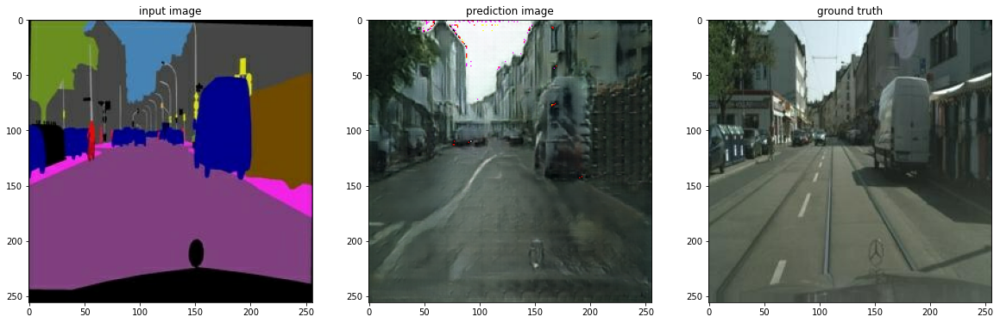

In [22]:
# 테스트 및 시각화

test_ind = 2

f = val_path + os.listdir(val_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1); plt.imshow(denormalize(sketch)); plt.title('input image')
plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('prediction image')
plt.subplot(1,3,3); plt.imshow(denormalize(colored)); plt.title('ground truth')

### loss 시각화
- 총 200 epochs동안 250 steps가 진행됨. (총 50,000 개의 loss 데이터 저장됨)  
1. generator loss: 

Text(0.5, 1.0, 'L1 loss')

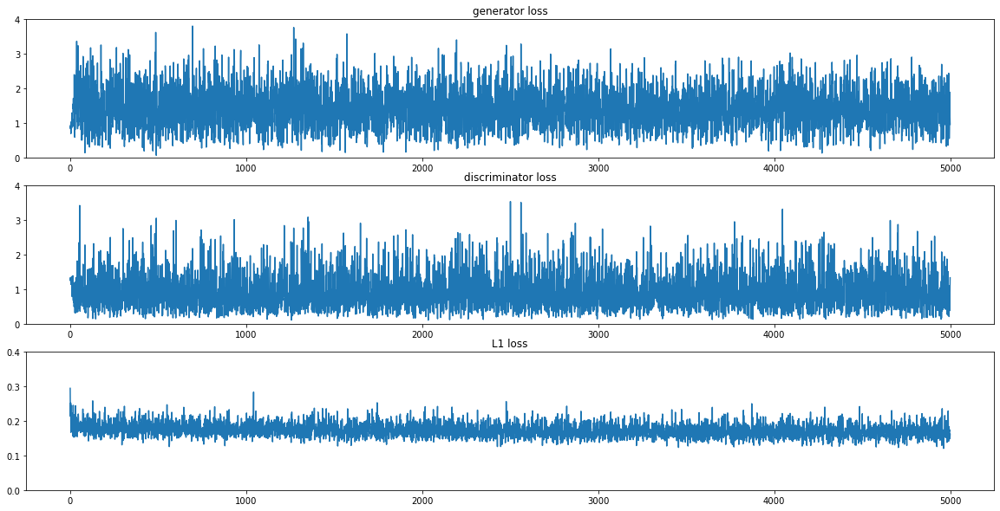

In [48]:
plt.figure(figsize=(20,10))

plt.subplot(3,1,1)
plt.plot(g_loss_list)
plt.ylim(0, 4)
plt.title('generator loss')

plt.subplot(3,1,2)
plt.plot(d_loss_list)
plt.ylim(0, 4)
plt.title('discriminator loss')

plt.subplot(3,1,3)
plt.plot(l1_loss_list)
plt.ylim(0, 0.4)
plt.title('L1 loss')

# 2. 회고

## 2-1. 루브릭 평가
### 1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.  
(데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.)  

### 2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.  
(U-Net generator, discriminator 모델 구현이 완료되어 train_step이 안정적으로 진행됨을 확인하였다.)  

### 3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.  
(10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.)  


## 2-2. 회고
